In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
from pathlib import Path
import pandas as pd
from sklearn.metrics import confusion_matrix
import warnings
warnings.filterwarnings('ignore')
from google.colab import drive
import glob

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pip install pillow pyheif


In [ ]:
from PIL import Image
import pyheif
import shutil

In [ ]:
dataset_path = '/content/drive/MyDrive/dataset'
pos_path = f'{dataset_path}/positif'
neg_path = f'{dataset_path}/negatif'

output_base = '/content/drive/MyDrive/rabies'
output_pos = os.path.join(output_base, 'positif')
output_neg = os.path.join(output_base, 'negatif')

In [ ]:
# Create new output folders
os.makedirs(output_pos, exist_ok=True)
os.makedirs(output_neg, exist_ok=True)

def convert_heic_to_jpg(heic_path, jpg_path):
    heif_file = pyheif.read(heic_path)
    image = Image.frombytes(
        heif_file.mode,
        heif_file.size,
        heif_file.data,
        "raw",
        heif_file.mode,
        heif_file.stride,
    )
    image.save(jpg_path, "JPEG")

def process_folder(input_folder, output_folder):
    extensions = set()
    for filename in os.listdir(input_folder):
        filepath = os.path.join(input_folder, filename)
        ext = os.path.splitext(filename)[1].lower()
        extensions.add(ext)

        try:
            if ext == ".heic":
                new_name = os.path.splitext(filename)[0] + ".jpg"
                output_path = os.path.join(output_folder, new_name)
                convert_heic_to_jpg(filepath, output_path)
            elif ext in [".jpg", ".jpeg", ".png"]:
                # Copy as-is (optional: convert to jpg if needed)
                output_path = os.path.join(output_folder, filename)
                shutil.copy2(filepath, output_path)
        except Exception as e:
            print(f"Error processing {filename}: {e}")
    return extensions

# Process and report extensions
print("Extensions in positif:")
pos_exts = process_folder(pos_path, output_pos)
print(pos_exts)

print("Extensions in negatif:")
neg_exts = process_folder(neg_path, output_neg)
print(neg_exts)

Extensions in positif:
{'.jpg', '.heic'}
Extensions in negatif:
{'.jpg'}


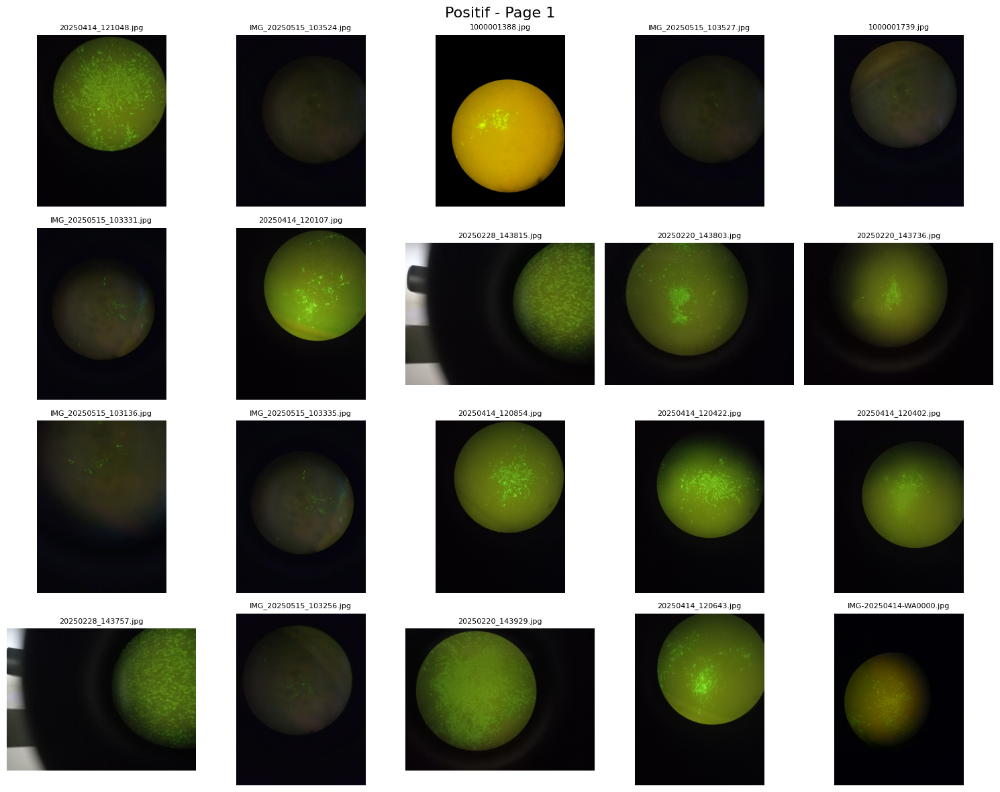

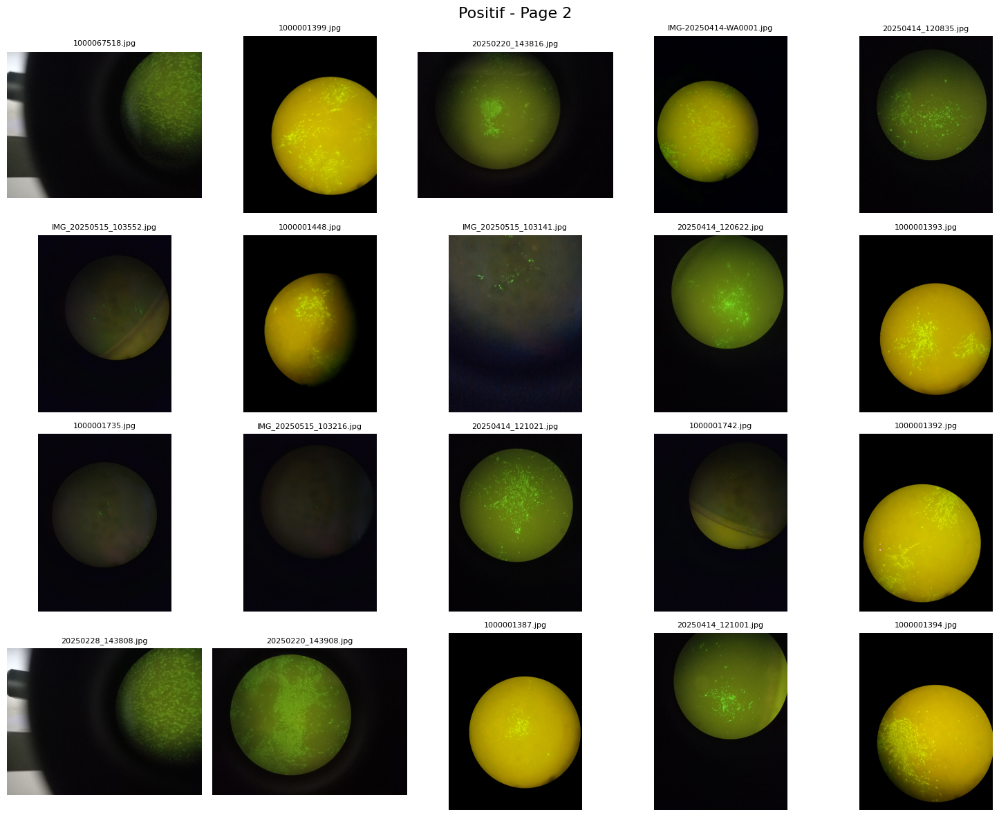

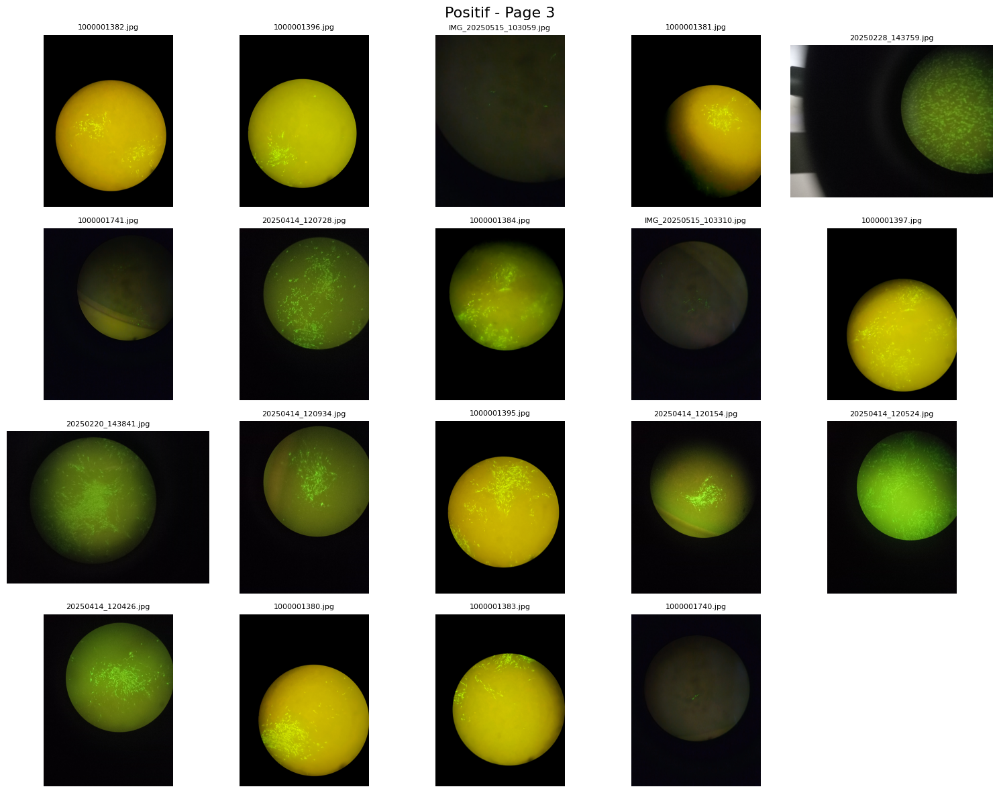

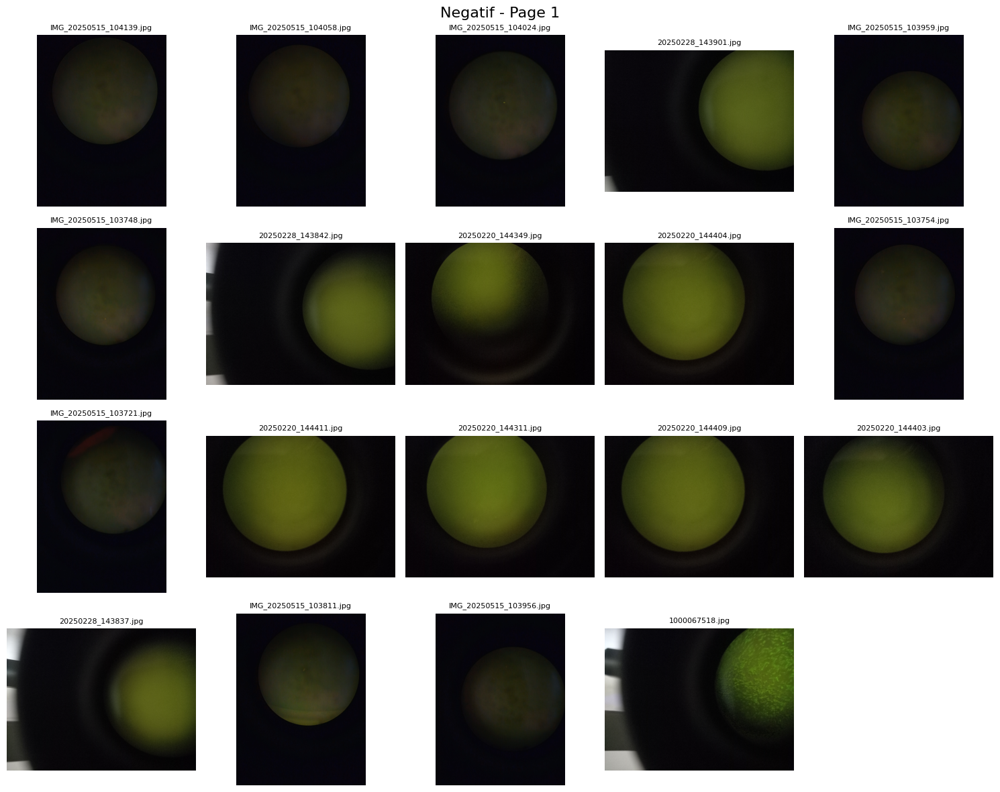

In [ ]:
# Paths to the new folders
base_path = '/content/drive/MyDrive/rabies'
folders = ['positif', 'negatif']

def load_images_from_folder(folder_path):
    image_files = []
    for file in os.listdir(folder_path):
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_files.append((file, os.path.join(folder_path, file)))
    return image_files

def show_images(images, title, per_row=5, per_page=20):
    total = len(images)
    pages = (total + per_page - 1) // per_page

    for page in range(pages):
        start = page * per_page
        end = min(start + per_page, total)
        batch = images[start:end]

        cols = min(per_row, len(batch))
        rows = (len(batch) + cols - 1) // cols

        plt.figure(figsize=(cols * 3, rows * 3))
        plt.suptitle(f"{title} - Page {page + 1}", fontsize=16)

        for i, (filename, filepath) in enumerate(batch):
            plt.subplot(rows, cols, i + 1)
            try:
                img = Image.open(filepath)
                plt.imshow(img)
                plt.title(filename, fontsize=8)
                plt.axis('off')
            except Exception as e:
                print(f"Could not load {filename}: {e}")

        plt.tight_layout()
        plt.show()

# Display images from both folders
for folder in folders:
    folder_path = os.path.join(base_path, folder)
    images = load_images_from_folder(folder_path)
    show_images(images, title=folder.capitalize(), per_row=5, per_page=20)

In [ ]:
import os

# Define the path to the duplicated image
image_path = '/content/drive/MyDrive/rabies/negatif/1000067518.jpg'

# Delete the image if it exists
if os.path.exists(image_path):
    os.remove(image_path)
    print("✅ Image '1000067518.jpg' has been successfully deleted from the 'negatif' folder.")
else:
    print("⚠️ Image '1000067518.jpg' was not found in the 'negatif' folder.")


✅ Image '1000067518.jpg' has been successfully deleted from the 'negatif' folder.



DATASET SUMMARY
Positive samples: 59
Negative samples: 18
Total samples: 77

AVERAGE VALUES:
------------------------------
Brightness:
  Positive: 37.4
  Negative: 23.7
Contrast:
  Positive: 41.6
  Negative: 22.6
Fluorescence Area:
  Positive: 0.094
  Negative: 0.094

KEY FINDINGS:
------------------------------
✓ Positive samples are brighter on average
✓ Positive samples have more fluorescent areas


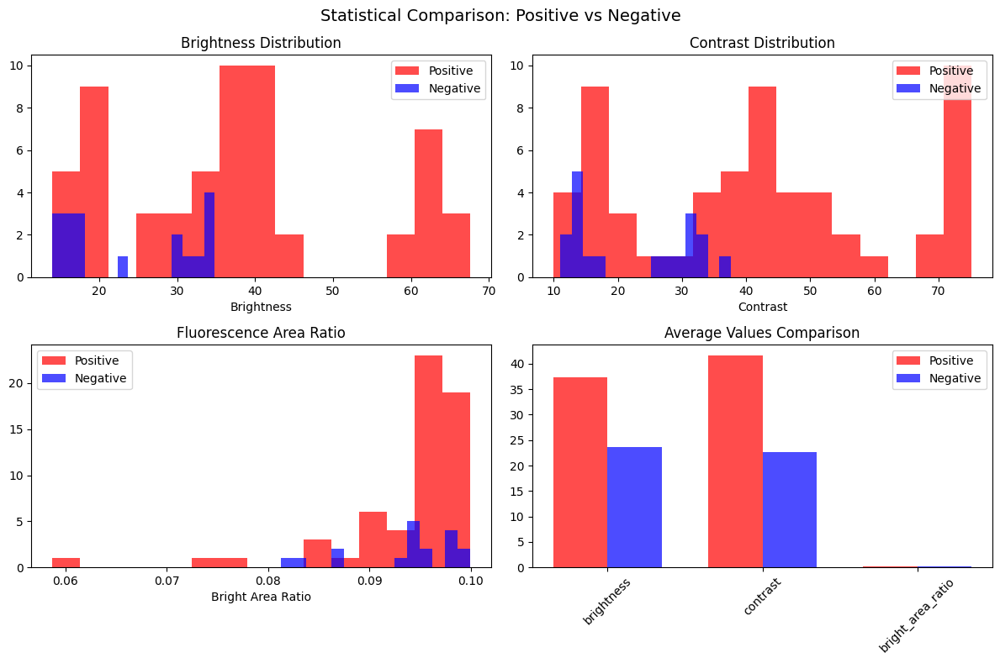

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def load_images_with_label(folder_path, label):
    """Load all images from a folder and assign a label"""
    images = []
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            path = os.path.join(folder_path, filename)
            img = cv2.imread(path)
            if img is not None:
                images.append((img, label))
    return images

def analyze_images(images, label):
    """Calculate basic statistics for images"""
    stats = []

    for img in images:
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Basic stats
        mean_intensity = np.mean(gray)
        brightness = mean_intensity
        contrast = np.std(gray)

        # Fluorescence area (bright pixels)
        bright_threshold = np.percentile(gray, 90)  # Top 10% brightest pixels
        bright_area = np.sum(gray > bright_threshold) / gray.size

        stats.append({
            'label': label,
            'mean_intensity': mean_intensity,
            'brightness': brightness,
            'contrast': contrast,
            'bright_area_ratio': bright_area,
            'max_intensity': np.max(gray),
            'min_intensity': np.min(gray)
        })

    return stats

def plot_comparisons(df):
    """Create comparison plots"""
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    fig.suptitle('Statistical Comparison: Positive vs Negative', fontsize=14)

    # Brightness comparison
    pos_brightness = df[df['label'] == 'positive']['brightness']
    neg_brightness = df[df['label'] == 'negative']['brightness']

    axes[0,0].hist(pos_brightness, alpha=0.7, label='Positive', color='red', bins=15)
    axes[0,0].hist(neg_brightness, alpha=0.7, label='Negative', color='blue', bins=15)
    axes[0,0].set_title('Brightness Distribution')
    axes[0,0].set_xlabel('Brightness')
    axes[0,0].legend()

    # Contrast comparison
    pos_contrast = df[df['label'] == 'positive']['contrast']
    neg_contrast = df[df['label'] == 'negative']['contrast']

    axes[0,1].hist(pos_contrast, alpha=0.7, label='Positive', color='red', bins=15)
    axes[0,1].hist(neg_contrast, alpha=0.7, label='Negative', color='blue', bins=15)
    axes[0,1].set_title('Contrast Distribution')
    axes[0,1].set_xlabel('Contrast')
    axes[0,1].legend()

    # Bright area comparison
    pos_bright = df[df['label'] == 'positive']['bright_area_ratio']
    neg_bright = df[df['label'] == 'negative']['bright_area_ratio']

    axes[1,0].hist(pos_bright, alpha=0.7, label='Positive', color='red', bins=15)
    axes[1,0].hist(neg_bright, alpha=0.7, label='Negative', color='blue', bins=15)
    axes[1,0].set_title('Fluorescence Area Ratio')
    axes[1,0].set_xlabel('Bright Area Ratio')
    axes[1,0].legend()

    # Bar plot of mean values
    features = ['brightness', 'contrast', 'bright_area_ratio']
    pos_means = [df[df['label'] == 'positive'][f].mean() for f in features]
    neg_means = [df[df['label'] == 'negative'][f].mean() for f in features]

    x = np.arange(len(features))
    width = 0.35

    axes[1,1].bar(x - width/2, pos_means, width, label='Positive', color='red', alpha=0.7)
    axes[1,1].bar(x + width/2, neg_means, width, label='Negative', color='blue', alpha=0.7)
    axes[1,1].set_title('Average Values Comparison')
    axes[1,1].set_xticks(x)
    axes[1,1].set_xticklabels(features, rotation=45)
    axes[1,1].legend()

    plt.tight_layout()
    plt.show()

def print_summary(df):
    """Print simple summary"""
    print("\n" + "="*50)
    print("DATASET SUMMARY")
    print("="*50)

    pos_count = len(df[df['label'] == 'positive'])
    neg_count = len(df[df['label'] == 'negative'])


    print(f"Positive samples: {pos_count}")
    print(f"Negative samples: {neg_count}")
    print(f"Total samples: {pos_count + neg_count}")

    print("\nAVERAGE VALUES:")
    print("-" * 30)

    pos_df = df[df['label'] == 'positive']
    neg_df = df[df['label'] == 'negative']

    print(f"Brightness:")
    print(f"  Positive: {pos_df['brightness'].mean():.1f}")
    print(f"  Negative: {neg_df['brightness'].mean():.1f}")

    print(f"Contrast:")
    print(f"  Positive: {pos_df['contrast'].mean():.1f}")
    print(f"  Negative: {neg_df['contrast'].mean():.1f}")

    print(f"Fluorescence Area:")
    print(f"  Positive: {pos_df['bright_area_ratio'].mean():.3f}")
    print(f"  Negative: {neg_df['bright_area_ratio'].mean():.3f}")

    print(f"\nKEY FINDINGS:")
    print("-" * 30)

    if pos_df['brightness'].mean() > neg_df['brightness'].mean():
        print("✓ Positive samples are brighter on average")
    else:
        print("⚠ Positive samples are NOT brighter on average")

    if pos_df['bright_area_ratio'].mean() > neg_df['bright_area_ratio'].mean():
        print("✓ Positive samples have more fluorescent areas")
    else:
        print("⚠ Positive samples do NOT have more fluorescent areas")

# ====================
# Run Everything
# ====================

# Set base path to your dataset
base_path = '/content/drive/MyDrive/rabies'
positive_path = os.path.join(base_path, 'positif')
negative_path = os.path.join(base_path, 'negatif')

# Load images
positive_images = [img for img, _ in load_images_with_label(positive_path, 'positive')]
negative_images = [img for img, _ in load_images_with_label(negative_path, 'negative')]

# Analyze
positive_stats = analyze_images(positive_images, label='positive')
negative_stats = analyze_images(negative_images, label='negative')

# Combine into DataFrame
df = pd.DataFrame(positive_stats + negative_stats)

# Print summary and plot comparisons
print_summary(df)
plot_comparisons(df)


# preprocessing

In [ ]:
!pip install roboflow
!pip install ultralytics

from roboflow import Roboflow
from ultralytics import YOLO

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="iikqpaDOob8gBYWthRdt")
project = rf.workspace("khalil-akremi-syexl").project("well-detection-unyvh")
version = project.version(4)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...


In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")  # or yolov8s.pt for more accuracy

model.train(
    data=dataset.location + "/data.yaml",  # Automatically points to your downloaded dataset
    epochs=50,
    imgsz=640,
    batch=16,
    name="well_detector_v1"
)

Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/well-detection-4/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=well_detector_v12, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, po

train: Scanning /content/well-detection-4/train/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 55.0±72.0 MB/s, size: 12.8 KB)


val: Scanning /content/well-detection-4/valid/labels.cache... 3 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3/3 [00:00<?, ?it/s]


Plotting labels to runs/detect/well_detector_v12/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/well_detector_v12
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      1.97G     0.7085       2.44      1.308         33        640: 100%|██████████| 4/4 [00:05<00:00,  1.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.44it/s]

                   all          3          3    0.00333          1       0.83      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      1.99G     0.6325      2.381      1.241         32        640: 100%|██████████| 4/4 [00:01<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.61it/s]

                   all          3          3    0.00333          1      0.995      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.01G     0.5398      1.727      1.156         29        640: 100%|██████████| 4/4 [00:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.22it/s]

                   all          3          3    0.00333          1      0.995       0.94



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.03G     0.5692      1.241      1.226         33        640: 100%|██████████| 4/4 [00:01<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.06it/s]

                   all          3          3    0.00333          1      0.373      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.04G     0.5353      1.009      1.169         25        640: 100%|██████████| 4/4 [00:00<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.47it/s]

                   all          3          3    0.00333          1      0.863      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.05G      0.496     0.8881      1.119         35        640: 100%|██████████| 4/4 [00:00<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.80it/s]

                   all          3          3      0.913          1      0.995      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.06G     0.5202     0.9211      1.133         25        640: 100%|██████████| 4/4 [00:01<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.75it/s]

                   all          3          3      0.922          1      0.995      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.06G     0.4816     0.8945      1.102         22        640: 100%|██████████| 4/4 [00:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]

                   all          3          3       0.88          1      0.995      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.07G     0.5278     0.9032      1.127         25        640: 100%|██████████| 4/4 [00:01<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]

                   all          3          3      0.947          1      0.995      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.07G     0.5122     0.8947      1.101         25        640: 100%|██████████| 4/4 [00:01<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]

                   all          3          3          1      0.946      0.995      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.07G     0.5633     0.8545       1.18         28        640: 100%|██████████| 4/4 [00:00<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.50it/s]

                   all          3          3      0.999          1      0.995      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.09G     0.5076     0.8842      1.146         34        640: 100%|██████████| 4/4 [00:00<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.36it/s]

                   all          3          3          1       0.96      0.995      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.09G     0.5213     0.8111      1.112         34        640: 100%|██████████| 4/4 [00:00<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.97it/s]

                   all          3          3      0.983          1      0.995      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.09G     0.5018     0.8299       1.12         37        640: 100%|██████████| 4/4 [00:00<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.98it/s]

                   all          3          3      0.985          1      0.995      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.11G      0.493     0.7445      1.098         34        640: 100%|██████████| 4/4 [00:00<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.78it/s]

                   all          3          3      0.977          1      0.995      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.11G      0.459     0.6937      1.048         33        640: 100%|██████████| 4/4 [00:00<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.75it/s]

                   all          3          3      0.967          1      0.995      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.11G     0.4662     0.7815      1.086         35        640: 100%|██████████| 4/4 [00:01<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


                   all          3          3      0.984          1      0.995      0.951

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.11G      0.474     0.7116      1.068         35        640: 100%|██████████| 4/4 [00:01<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.06it/s]

                   all          3          3      0.985          1      0.995       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.12G     0.4841      0.702      1.067         25        640: 100%|██████████| 4/4 [00:00<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.56it/s]

                   all          3          3      0.983          1      0.995      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.12G      0.463     0.6718      1.091         26        640: 100%|██████████| 4/4 [00:00<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.32it/s]

                   all          3          3      0.983          1      0.995       0.94



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.12G     0.4832     0.6632      1.092         31        640: 100%|██████████| 4/4 [00:00<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 17.57it/s]

                   all          3          3      0.984          1      0.995      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.12G     0.4832     0.6537       1.11         32        640: 100%|██████████| 4/4 [00:00<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.07it/s]

                   all          3          3      0.982          1      0.995      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.12G     0.5126     0.7183      1.093         28        640: 100%|██████████| 4/4 [00:00<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.55it/s]

                   all          3          3      0.982          1      0.995      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.12G     0.4694     0.6403       1.07         38        640: 100%|██████████| 4/4 [00:00<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.20it/s]

                   all          3          3      0.984          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.12G     0.5015      0.651      1.103         31        640: 100%|██████████| 4/4 [00:00<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.28it/s]

                   all          3          3      0.986          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.12G      0.446     0.6568      1.043         26        640: 100%|██████████| 4/4 [00:00<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.04it/s]

                   all          3          3      0.987          1      0.995      0.929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.12G     0.4351     0.5969      1.051         32        640: 100%|██████████| 4/4 [00:00<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.86it/s]

                   all          3          3      0.986          1      0.995      0.962



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.12G     0.5604     0.6423      1.126         35        640: 100%|██████████| 4/4 [00:01<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.63it/s]

                   all          3          3      0.986          1      0.995       0.94



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.12G      0.435     0.6439       1.03         32        640: 100%|██████████| 4/4 [00:01<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]

                   all          3          3      0.984          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.12G     0.4396     0.5873      1.044         36        640: 100%|██████████| 4/4 [00:00<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.57it/s]

                   all          3          3      0.984          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.12G     0.3865     0.5287      1.014         33        640: 100%|██████████| 4/4 [00:00<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.78it/s]

                   all          3          3      0.981          1      0.995      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.12G     0.4138     0.5414      1.061         32        640: 100%|██████████| 4/4 [00:00<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.68it/s]

                   all          3          3      0.984          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.13G     0.3975      0.561      1.043         26        640: 100%|██████████| 4/4 [00:00<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  8.56it/s]

                   all          3          3      0.986          1      0.995      0.962



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.14G     0.4614     0.5766      1.086         32        640: 100%|██████████| 4/4 [00:00<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.67it/s]

                   all          3          3      0.986          1      0.995      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.14G     0.4122     0.5207      1.038         29        640: 100%|██████████| 4/4 [00:00<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.30it/s]

                   all          3          3      0.986          1      0.995       0.94



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.15G     0.3816     0.5369      1.031         24        640: 100%|██████████| 4/4 [00:00<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 20.07it/s]

                   all          3          3      0.987          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.17G     0.4051     0.5519      1.014         33        640: 100%|██████████| 4/4 [00:00<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.72it/s]

                   all          3          3      0.987          1      0.995      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.17G     0.4006     0.5711      1.028         29        640: 100%|██████████| 4/4 [00:00<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]

                   all          3          3      0.987          1      0.995      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.17G     0.3755     0.5849      1.003         28        640: 100%|██████████| 4/4 [00:01<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.02it/s]

                   all          3          3      0.987          1      0.995       0.94



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.17G      0.344     0.4917       0.98         37        640: 100%|██████████| 4/4 [00:01<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]

                   all          3          3      0.987          1      0.995       0.94


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.17G     0.3023     0.8668     0.9746         12        640: 100%|██████████| 4/4 [00:01<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


                   all          3          3      0.987          1      0.995       0.94

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.17G     0.3408     0.8339      1.069         12        640: 100%|██████████| 4/4 [00:00<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.82it/s]

                   all          3          3      0.987          1      0.995      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.17G      0.296     0.7215      1.023         12        640: 100%|██████████| 4/4 [00:00<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.34it/s]

                   all          3          3      0.987          1      0.995       0.94



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.17G     0.3041     0.7573      1.013         12        640: 100%|██████████| 4/4 [00:00<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 13.88it/s]

                   all          3          3      0.987          1      0.995       0.94



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      2.17G      0.278     0.7443     0.9722         12        640: 100%|██████████| 4/4 [00:00<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 21.71it/s]

                   all          3          3      0.987          1      0.995       0.94



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.17G     0.2623     0.7419     0.9702         12        640: 100%|██████████| 4/4 [00:00<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.42it/s]

                   all          3          3      0.987          1      0.995       0.94



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.17G     0.2731     0.7227     0.9951         12        640: 100%|██████████| 4/4 [00:00<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 14.80it/s]

                   all          3          3      0.987          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.17G     0.3354     0.7628      1.022         12        640: 100%|██████████| 4/4 [00:01<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.13it/s]


                   all          3          3      0.987          1      0.995      0.995

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      2.17G     0.2799     0.6969      0.995         12        640: 100%|██████████| 4/4 [00:00<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.24it/s]

                   all          3          3      0.987          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.17G     0.2583     0.6829     0.9335         12        640: 100%|██████████| 4/4 [00:01<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]

                   all          3          3      0.987          1      0.995      0.995



50 epochs completed in 0.021 hours.
Optimizer stripped from runs/detect/well_detector_v12/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/well_detector_v12/weights/best.pt, 6.2MB

Validating runs/detect/well_detector_v12/weights/best.pt...
Ultralytics 8.3.162 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 23.85it/s]


                   all          3          3      0.987          1      0.995      0.995
Speed: 0.3ms preprocess, 5.1ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/well_detector_v12


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d687acd54d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
from ultralytics import YOLO

# Load trained model
model = YOLO("runs/detect/well_detector_v1/weights/best.pt")

# Input folders
dataset_path = '/content/drive/MyDrive/rabies'
pos_path = f'{dataset_path}/positif'
neg_path = f'{dataset_path}/negatif'

# Output folders
output_root = '/content/drive/MyDrive/rabies_data_crop'
pos_output = f'{output_root}/positif'
neg_output = f'{output_root}/negatif'

# Create output folders if they don't exist
os.makedirs(pos_output, exist_ok=True)
os.makedirs(neg_output, exist_ok=True)

# Function to process a folder of images
def crop_and_save(input_folder, output_folder):
    image_paths = list(Path(input_folder).glob("*.jpg")) + list(Path(input_folder).glob("*.png"))

    for image_path in image_paths:
        image = cv2.imread(str(image_path))
        results = model.predict(str(image_path), conf=0.4)

        for i, box in enumerate(results[0].boxes.xyxy):
            x1, y1, x2, y2 = map(int, box.tolist())
            crop = image[y1:y2, x1:x2]
            crop_name = f"{image_path.stem}_crop_{i}.png"
            cv2.imwrite(os.path.join(output_folder, crop_name), crop)

# Run for both folders
crop_and_save(pos_path, pos_output)
crop_and_save(neg_path, neg_output)


image 1/1 /content/drive/MyDrive/rabies/positif/20250414_121048.jpg: 640x480 1 well, 36.3ms
Speed: 3.2ms preprocess, 36.3ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /content/drive/MyDrive/rabies/positif/IMG_20250515_103524.jpg: 640x480 1 well, 7.4ms
Speed: 3.2ms preprocess, 7.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /content/drive/MyDrive/rabies/positif/1000001388.jpg: 640x480 1 well, 7.3ms
Speed: 3.3ms preprocess, 7.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /content/drive/MyDrive/rabies/positif/IMG_20250515_103527.jpg: 640x480 1 well, 8.0ms
Speed: 3.1ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /content/drive/MyDrive/rabies/positif/1000001739.jpg: 640x480 1 well, 11.8ms
Speed: 6.2ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /content/drive/MyDrive/rabies/positif/IMG_20250

In [ ]:
import os
import shutil
import random

# Set seed for reproducibility
random.seed(42)

# Source dataset
src_path = '/content/drive/MyDrive/rabies_data_crop'
dest_path = '/content/drive/MyDrive/data_split'

# Define classes
classes = ['positif', 'negatif']

# Create destination directories
for split in ['train', 'test']:
    for cls in classes:
        os.makedirs(os.path.join(dest_path, split, cls), exist_ok=True)

# Split ratio
train_ratio = 0.8

# Go through each class folder and split files
for cls in classes:
    class_src_dir = os.path.join(src_path, cls)
    all_files = [f for f in os.listdir(class_src_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    random.shuffle(all_files)

    split_idx = int(len(all_files) * train_ratio)
    train_files = all_files[:split_idx]
    test_files = all_files[split_idx:]

    # Copy files
    for fname in train_files:
        shutil.copy2(os.path.join(class_src_dir, fname), os.path.join(dest_path, 'train', cls, fname))
    for fname in test_files:
        shutil.copy2(os.path.join(class_src_dir, fname), os.path.join(dest_path, 'test', cls, fname))

print("✅ Images have been split and saved to 'data_split' folder.")



✅ Images have been split and saved to 'data_split' folder.


In [ ]:
import os
from PIL import Image
from torchvision import transforms
from torchvision.transforms.autoaugment import TrivialAugmentWide
from tqdm import tqdm

# Base input and output paths
input_base = '/content/drive/MyDrive/data_split'

output_base = '/content/drive/MyDrive/augmented_data_1'


# Define folders and classes
splits = ['train']
classes = ['positif', 'negatif']

# Augmentation versions
augmentations = {
    'aug1': transforms.Compose([
        TrivialAugmentWide(),
        transforms.Resize((224, 224)),
    ]),
    'aug2': transforms.Compose([
        transforms.RandomRotation(degrees=30),
        transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2, hue=0.1),
        transforms.Resize((224, 224)),
    ]),
    'aug3': transforms.Compose([
        transforms.RandomHorizontalFlip(p=1.0),
        transforms.GaussianBlur(3),
        transforms.Resize((224, 224)),
    ]),
}

# Save function for each augmentation version
def save_augmented_images(aug_name, transform):
    for split in splits:
        for cls in classes:
            input_folder = os.path.join(input_base, split, cls)
            output_folder = os.path.join(output_base, aug_name, split, cls)
            os.makedirs(output_folder, exist_ok=True)

            for filename in tqdm(os.listdir(input_folder), desc=f"{aug_name}-{split}-{cls}"):
                if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
                    img_path = os.path.join(input_folder, filename)
                    try:
                        image = Image.open(img_path).convert('RGB')
                        augmented = transform(image)

                        save_path = os.path.join(output_folder, filename)
                        augmented.save(save_path)
                    except Exception as e:
                        print(f"❌ Failed to process {img_path}: {e}")

# Run augmentations
for aug_name, transform in augmentations.items():
    save_augmented_images(aug_name, transform)

print("✅ All train/test images augmented and saved.")
image_path1 = '/content/drive/MyDrive/augmented_data_1/aug1/train'
image_path2 = '/content/drive/MyDrive/augmented_data_1/aug2/train'
image_path3 = '/content/drive/MyDrive/augmented_data_1/aug3/train'


aug3-train-negatif: 100%|██████████| 14/14 [00:27<00:00,  1.97s/it]

✅ All train/test images augmented and saved.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.models as models
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
import seaborn as sns
from tqdm import tqdm
import json
import time
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')

# Configuration
BASE_PATH = '/content/drive/MyDrive'
RESULTS_PATH = '/content/drive/MyDrive/results'
MODELS_PATH = '/content/drive/MyDrive/models'

# Setup Dirs - Replace these with your actual paths
train_dir1 = '/content/drive/MyDrive/augmented_data_1/aug1/train'
train_dir2 = '/content/drive/MyDrive/augmented_data_1/aug2/train'
train_dir3 = '/content/drive/MyDrive/augmented_data_1/aug3/train'
test_dir = '/content/drive/MyDrive/data_split/test'

# Training parameters
BATCH_SIZE = 32
NUM_EPOCHS = 25
LEARNING_RATE = 0.001
WEIGHT_DECAY = 1e-4
PATIENCE = 7  # Early stopping patience
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Model configurations
MODEL_CONFIGS = {
    'efficientnet_b0': {
        'model_fn': models.efficientnet_b0,
        'feature_dim': 1280,
        'input_size': 224
    },
    'efficientnet_b2': {
        'model_fn': models.efficientnet_b2,
        'feature_dim': 1408,
        'input_size': 260
    },
    'vgg16': {
        'model_fn': models.vgg16,
        'feature_dim': 4096, # Corrected feature dimension for VGG16
        'input_size': 224
    },
    'vit_b_16': {
        'model_fn': models.vit_b_16,
        'feature_dim': 768,
        'input_size': 224
    }
}

# Dataset configurations
DATASET_CONFIGS = {
    'light_augmentation': {
        'train_dir': train_dir1,
        'description': 'Light Augmentation Dataset'
    },
    'medium_augmentation': {
        'train_dir': train_dir2,
        'description': 'Medium Augmentation Dataset'
    },
    'heavy_augmentation': {
        'train_dir': train_dir3,
        'description': 'Heavy Augmentation Dataset'
    }
}

class CustomDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform
        self.samples = []

        # Auto-detect classes from directory structure
        self.classes = []
        if os.path.exists(data_dir):
            self.classes = [d for d in os.listdir(data_dir)
                          if os.path.isdir(os.path.join(data_dir, d))]

        self.class_to_idx = {cls_name: idx for idx, cls_name in enumerate(sorted(self.classes))}
        self.num_classes = len(self.classes)

        # Load all image paths and labels
        for class_name in self.classes:
            class_dir = os.path.join(data_dir, class_name)
            if os.path.exists(class_dir):
                for filename in os.listdir(class_dir):
                    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                        self.samples.append((
                            os.path.join(class_dir, filename),
                            self.class_to_idx[class_name]
                        ))

        print(f"Dataset loaded: {len(self.samples)} samples, {self.num_classes} classes")
        print(f"Classes: {self.classes}")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        image_path, label = self.samples[idx]

        try:
            # Load image
            image = Image.open(image_path).convert('RGB')

            if self.transform:
                image = self.transform(image)

            return image, label
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
            # Return a blank image in case of error
            blank_image = Image.new('RGB', (224, 224), color='white')
            if self.transform:
                blank_image = self.transform(blank_image)
            return blank_image, label


def get_transforms(input_size=224):
    """Get data transforms for training and testing"""

    train_transform = transforms.Compose([
        transforms.Resize((input_size, input_size)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(10),
        transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                           std=[0.229, 0.224, 0.225])
    ])

    test_transform = transforms.Compose([
        transforms.Resize((input_size, input_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                           std=[0.229, 0.224, 0.225])
    ])

    return train_transform, test_transform

def create_model(model_name, num_classes, pretrained=True):
    """Create and modify pretrained model for classification"""

    config = MODEL_CONFIGS[model_name]

    try:
        model = config['model_fn'](pretrained=pretrained)

        # Modify the final layer based on model architecture
        if 'efficientnet' in model_name:
            model.classifier[1] = nn.Linear(config['feature_dim'], num_classes)
        elif 'vgg' in model_name:
            model.classifier[6] = nn.Linear(config['feature_dim'], num_classes)
        elif 'vit_b_16' in model_name:
            model.heads.head = nn.Linear(config['feature_dim'], num_classes)

        return model

    except Exception as e:
        print(f"Error creating model {model_name}: {e}")
        return None

def create_dataloaders(dataset_config, batch_size=32):
    """Create data loaders for train and test sets"""

    train_dir = dataset_config['train_dir']
    input_size = 224  # Default input size

    train_transform, test_transform = get_transforms(input_size)

    # Create datasets
    train_dataset = CustomDataset(train_dir, transform=train_transform)
    test_dataset = CustomDataset(test_dir, transform=test_transform)

    # Create data loaders
    train_loader = DataLoader(
        train_dataset, batch_size=batch_size,
        shuffle=True, num_workers=2, pin_memory=True
    )

    test_loader = DataLoader(
        test_dataset, batch_size=batch_size,
        shuffle=False, num_workers=2, pin_memory=True
    )

    print(f"Dataset: {dataset_config['description']}")
    print(f"  Train: {len(train_dataset)} samples")
    print(f"  Test: {len(test_dataset)} samples")

    return train_loader, test_loader, train_dataset.num_classes

class EarlyStopping:
    def __init__(self, patience=7, min_delta=0.001):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = float('inf')
        self.best_accuracy = 0.0

    def __call__(self, val_loss, val_accuracy):
        improved = False
        if val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.best_accuracy = val_accuracy
            self.counter = 0
            improved = True
        else:
            self.counter += 1

        return self.counter >= self.patience, improved

def train_epoch(model, train_loader, criterion, optimizer, device):
    """Train model for one epoch"""
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    pbar = tqdm(train_loader, desc='Training')
    for batch_idx, (inputs, targets) in enumerate(pbar):
        inputs, targets = inputs.to(device), targets.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = outputs.max(1)
        total += targets.size(0)
        correct += predicted.eq(targets).sum().item()

        # Update progress bar
        pbar.set_postfix({
            'Loss': f'{running_loss/(batch_idx+1):.4f}',
            'Acc': f'{100.*correct/total:.2f}%'
        })

    epoch_loss = running_loss / len(train_loader)
    epoch_acc = 100. * correct / total

    return epoch_loss, epoch_acc

def validate_epoch(model, test_loader, criterion, device):
    """Validate model on test set"""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_targets = []
    all_probs = []

    with torch.no_grad():
        for inputs, targets in tqdm(test_loader, desc='Testing'):
            inputs, targets = inputs.to(device), targets.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, targets)

            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += targets.size(0)
            correct += predicted.eq(targets).sum().item()

            # Store predictions for metrics
            all_preds.extend(predicted.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            probs = torch.softmax(outputs, dim=1)
            all_probs.extend(probs.cpu().numpy())

    epoch_loss = running_loss / len(test_loader)
    epoch_acc = 100. * correct / total

    return epoch_loss, epoch_acc, all_preds, all_targets, all_probs

def train_model(model, train_loader, test_loader, model_name, dataset_name, num_epochs=25):
    """Complete training loop with early stopping"""

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)

    early_stopping = EarlyStopping(patience=PATIENCE)

    # Training history
    history = {
        'train_loss': [], 'train_acc': [],
        'test_loss': [], 'test_acc': []
    }

    best_model_state = None
    best_test_acc = 0.0

    print(f"\n🚀 Training {model_name} on {dataset_name}")
    print(f"Device: {DEVICE}")
    print("-" * 60)

    for epoch in range(num_epochs):
        start_time = time.time()

        # Train
        train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, DEVICE)

        # Test
        test_loss, test_acc, test_preds, test_targets, test_probs = validate_epoch(
            model, test_loader, criterion, DEVICE
        )

        # Update learning rate
        scheduler.step(test_loss)

        # Early stopping check
        should_stop, improved = early_stopping(test_loss, test_acc)

        if improved:
            best_test_acc = test_acc
            best_model_state = model.state_dict().copy()

        # Record history
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['test_loss'].append(test_loss)
        history['test_acc'].append(test_acc)

        epoch_time = time.time() - start_time

        print(f"Epoch {epoch+1:2d}/{num_epochs} | "
              f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}% | "
              f"Test Loss: {test_loss:.4f} | Test Acc: {test_acc:.2f}% | "
              f"Time: {epoch_time:.1f}s")

        # Early stopping
        if should_stop:
            print(f"Early stopping triggered after epoch {epoch+1}")
            break

    # Load best model state
    if best_model_state is not None:
        model.load_state_dict(best_model_state)

    return model, history, best_test_acc


def evaluate_model(model, test_loader, device, num_classes):
    """Comprehensive model evaluation"""
    model.eval()
    all_preds = []
    all_targets = []
    all_probs = []

    with torch.no_grad():
        for inputs, targets in tqdm(test_loader, desc='Final Evaluation'):
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)

            _, predicted = outputs.max(1)
            probs = torch.softmax(outputs, dim=1)

            all_preds.extend(predicted.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())


    # Calculate metrics
    accuracy = np.mean(np.array(all_preds) == np.array(all_targets)) * 100

    # Calculate AUC for binary classification
    auc_score = None
    if num_classes == 2:
        auc_score = roc_auc_score(all_targets, np.array(all_probs)[:, 1])

    # Classification report
    class_report = classification_report(
        all_targets, all_preds, output_dict=True, zero_division=0
    )


    return {
        'accuracy': accuracy,
        'auc_score': auc_score,
        'predictions': all_preds,
        'targets': all_targets,
        'probabilities': all_probs,
        'classification_report': class_report
    }

def plot_training_history(history, model_name, dataset_name, save_path):
    """Plot training history"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # Loss plot
    ax1.plot(history['train_loss'], label='Train Loss', color='blue')
    ax1.plot(history['test_loss'], label='Test Loss', color='red')
    ax1.set_title(f'{model_name} - Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True)

    # Accuracy plot
    ax2.plot(history['train_acc'], label='Train Acc', color='blue')
    ax2.plot(history['test_acc'], label='Test Acc', color='red')
    ax2.set_title(f'{model_name} - Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy (%)')
    ax2.legend()
    ax2.grid(True)

    plt.suptitle(f'{model_name} on {dataset_name}', fontsize=16)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.close()

def plot_confusion_matrix(targets, predictions, model_name, dataset_name, save_path, class_names=None):
    """Plot confusion matrix"""
    cm = confusion_matrix(targets, predictions)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names if class_names else range(len(cm)),
                yticklabels=class_names if class_names else range(len(cm)))
    plt.title(f'{model_name} - Confusion Matrix\n{dataset_name}')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.close()

def save_results(results, model_name, dataset_name, history):
    """Save training and evaluation results"""
    # Create results directory
    results_dir = os.path.join(RESULTS_PATH, dataset_name, model_name)
    os.makedirs(results_dir, exist_ok=True)

    # Save results as JSON
    results_file = os.path.join(results_dir, 'results.json')

    # Prepare results for JSON serialization
    json_results = {
        'model_name': model_name,
        'dataset_name': dataset_name,
        'test_accuracy': results['accuracy'],
        'auc_score': results['auc_score'],
        'classification_report': results['classification_report'],
        'training_history': history
    }

    with open(results_file, 'w') as f:
        json.dump(json_results, f, indent=2)

    return results_dir

def main_training_loop():
    """Main training loop for all model-dataset combinations"""

    # Create output directories
    os.makedirs(RESULTS_PATH, exist_ok=True)
    os.makedirs(MODELS_PATH, exist_ok=True)

    # Results summary
    all_results = defaultdict(dict)

    print("🔥 Starting Transfer Learning Pipeline")
    print(f"Device: {DEVICE}")
    print(f"Models: {list(MODEL_CONFIGS.keys())}")
    print(f"Datasets: {list(DATASET_CONFIGS.keys())}")
    print("=" * 80)

    # Get number of classes from test dataset
    test_dataset = CustomDataset(test_dir, transform=None)
    num_classes = test_dataset.num_classes
    print(f"Number of classes detected: {num_classes}")

    for dataset_name, dataset_config in DATASET_CONFIGS.items():
        print(f"\n📊 Processing Dataset: {dataset_name}")

        # Create data loaders
        train_loader, test_loader, train_num_classes = create_dataloaders(dataset_config, BATCH_SIZE)

        # Ensure consistent number of classes
        if train_num_classes != num_classes:
            print(f"Warning: Inconsistent number of classes between train ({train_num_classes}) and test ({num_classes})")

        for model_name in MODEL_CONFIGS.keys():
            print(f"\n🤖 Training Model: {model_name}")

            try:
                # Create model
                model = create_model(model_name, num_classes, pretrained=True)
                if model is None:
                    continue

                model = model.to(DEVICE)

                # Train model
                trained_model, history, best_test_acc = train_model(
                    model, train_loader, test_loader, model_name, dataset_name, NUM_EPOCHS
                )

                # Final evaluation on test set
                test_results = evaluate_model(trained_model, test_loader, DEVICE, num_classes)

                # Save results
                results_dir = save_results(test_results, model_name, dataset_name, history)

                # Plot training history
                plot_training_history(
                    history, model_name, dataset_name,
                    os.path.join(results_dir, 'training_history.png')
                )

                # Plot confusion matrix
                plot_confusion_matrix(
                    test_results['targets'], test_results['predictions'],
                    model_name, dataset_name,
                    os.path.join(results_dir, 'confusion_matrix.png'),
                    class_names=test_dataset.classes
                )

                # Save model
                model_save_path = os.path.join(MODELS_PATH, f"{model_name}_{dataset_name}.pth")
                torch.save(trained_model.state_dict(), model_save_path)

                # Store results for summary
                all_results[dataset_name][model_name] = {
                    'test_accuracy': test_results['accuracy'],
                    'auc_score': test_results['auc_score'],
                    'best_test_acc': best_test_acc
                }

                print(f"✅ {model_name} completed - Test Acc: {test_results['accuracy']:.2f}%")
                if test_results['auc_score'] is not None:
                    print(f"   AUC Score: {test_results['auc_score']:.4f}")

            except Exception as e:
                print(f"❌ Error training {model_name} on {dataset_name}: {str(e)}")
                continue

    # Print final summary
    print("\n" + "=" * 80)
    print("🏆 FINAL RESULTS SUMMARY")
    print("=" * 80)

    for dataset_name in DATASET_CONFIGS.keys():
        print(f"\n📊 {dataset_name.upper().replace('_', ' ')}")
        print("-" * 60)

        if dataset_name in all_results:
            for model_name, metrics in all_results[dataset_name].items():
                auc_str = f"AUC: {metrics['auc_score']:.4f}" if metrics['auc_score'] is not None else "AUC: N/A"
                print(f"{model_name:15} | Acc: {metrics['test_accuracy']:6.2f}% | {auc_str}")
        else:
            print("No results available")

    print(f"\n📁 All results saved to: {RESULTS_PATH}")
    print(f"💾 All models saved to: {MODELS_PATH}")

if __name__ == "__main__":
    main_training_loop()

🔥 Starting Transfer Learning Pipeline
Device: cuda
Models: ['efficientnet_b0', 'efficientnet_b2', 'vgg16', 'vit_b_16']
Datasets: ['light_augmentation', 'medium_augmentation', 'heavy_augmentation']
Dataset loaded: 16 samples, 2 classes
Classes: ['positif', 'negatif']
Number of classes detected: 2

📊 Processing Dataset: light_augmentation
Dataset loaded: 61 samples, 2 classes
Classes: ['positif', 'negatif']
Dataset loaded: 16 samples, 2 classes
Classes: ['positif', 'negatif']
Dataset: Light Augmentation Dataset
  Train: 61 samples
  Test: 16 samples

🤖 Training Model: efficientnet_b0

🚀 Training efficientnet_b0 on light_augmentation
Device: cuda
------------------------------------------------------------


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.89s/it]


Epoch  1/25 | Train Loss: 0.6215 | Train Acc: 62.30% | Test Loss: 0.4072 | Test Acc: 87.50% | Time: 5.3s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.35s/it]


Epoch  2/25 | Train Loss: 0.3139 | Train Acc: 85.25% | Test Loss: 0.3069 | Test Acc: 87.50% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.64s/it]


Epoch  3/25 | Train Loss: 0.1586 | Train Acc: 95.08% | Test Loss: 0.3410 | Test Acc: 87.50% | Time: 4.8s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.49s/it]


Epoch  4/25 | Train Loss: 0.0722 | Train Acc: 100.00% | Test Loss: 0.2335 | Test Acc: 87.50% | Time: 6.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.31s/it]


Epoch  5/25 | Train Loss: 0.0586 | Train Acc: 98.36% | Test Loss: 0.0120 | Test Acc: 100.00% | Time: 4.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.26s/it]


Epoch  6/25 | Train Loss: 0.0423 | Train Acc: 98.36% | Test Loss: 0.0014 | Test Acc: 100.00% | Time: 4.4s


Testing: 100%|██████████| 1/1 [00:06<00:00,  6.30s/it]


Epoch  7/25 | Train Loss: 0.0255 | Train Acc: 98.36% | Test Loss: 0.0012 | Test Acc: 100.00% | Time: 8.7s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.20s/it]


Epoch  8/25 | Train Loss: 0.0587 | Train Acc: 98.36% | Test Loss: 0.0002 | Test Acc: 100.00% | Time: 4.4s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.31s/it]


Epoch  9/25 | Train Loss: 0.0043 | Train Acc: 100.00% | Test Loss: 0.0003 | Test Acc: 100.00% | Time: 5.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.24s/it]


Epoch 10/25 | Train Loss: 0.0074 | Train Acc: 100.00% | Test Loss: 0.0062 | Test Acc: 100.00% | Time: 4.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.29s/it]


Epoch 11/25 | Train Loss: 0.0058 | Train Acc: 100.00% | Test Loss: 0.1566 | Test Acc: 93.75% | Time: 4.4s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


Epoch 12/25 | Train Loss: 0.0008 | Train Acc: 100.00% | Test Loss: 0.3560 | Test Acc: 93.75% | Time: 5.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.23s/it]


Epoch 13/25 | Train Loss: 0.0047 | Train Acc: 100.00% | Test Loss: 0.3750 | Test Acc: 93.75% | Time: 4.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.24s/it]


Epoch 14/25 | Train Loss: 0.0021 | Train Acc: 100.00% | Test Loss: 0.2784 | Test Acc: 93.75% | Time: 4.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.77s/it]


Epoch 15/25 | Train Loss: 0.0012 | Train Acc: 100.00% | Test Loss: 0.1513 | Test Acc: 93.75% | Time: 5.4s
Early stopping triggered after epoch 15


Final Evaluation: 100%|██████████| 1/1 [00:03<00:00,  3.23s/it]


✅ efficientnet_b0 completed - Test Acc: 93.75%
   AUC Score: 1.0000

🤖 Training Model: efficientnet_b2

🚀 Training efficientnet_b2 on light_augmentation
Device: cuda
------------------------------------------------------------


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.16s/it]


Epoch  1/25 | Train Loss: 0.5687 | Train Acc: 65.57% | Test Loss: 0.5482 | Test Acc: 81.25% | Time: 5.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.25s/it]


Epoch  2/25 | Train Loss: 0.2946 | Train Acc: 88.52% | Test Loss: 0.4021 | Test Acc: 87.50% | Time: 5.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.22s/it]


Epoch  3/25 | Train Loss: 0.1104 | Train Acc: 98.36% | Test Loss: 0.1667 | Test Acc: 93.75% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.30s/it]


Epoch  4/25 | Train Loss: 0.0472 | Train Acc: 100.00% | Test Loss: 0.0852 | Test Acc: 93.75% | Time: 5.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.25s/it]


Epoch  5/25 | Train Loss: 0.0239 | Train Acc: 100.00% | Test Loss: 0.1048 | Test Acc: 93.75% | Time: 4.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.23s/it]


Epoch  6/25 | Train Loss: 0.0124 | Train Acc: 100.00% | Test Loss: 0.0759 | Test Acc: 93.75% | Time: 4.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.88s/it]


Epoch  7/25 | Train Loss: 0.0229 | Train Acc: 98.36% | Test Loss: 0.0757 | Test Acc: 93.75% | Time: 5.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.25s/it]


Epoch  8/25 | Train Loss: 0.0645 | Train Acc: 96.72% | Test Loss: 0.0172 | Test Acc: 100.00% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.73s/it]


Epoch  9/25 | Train Loss: 0.0117 | Train Acc: 100.00% | Test Loss: 0.0022 | Test Acc: 100.00% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.24s/it]


Epoch 10/25 | Train Loss: 0.0042 | Train Acc: 100.00% | Test Loss: 0.0009 | Test Acc: 100.00% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.20s/it]


Epoch 11/25 | Train Loss: 0.0090 | Train Acc: 100.00% | Test Loss: 0.0007 | Test Acc: 100.00% | Time: 4.5s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.31s/it]


Epoch 12/25 | Train Loss: 0.0269 | Train Acc: 98.36% | Test Loss: 0.0008 | Test Acc: 100.00% | Time: 5.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.30s/it]


Epoch 13/25 | Train Loss: 0.0024 | Train Acc: 100.00% | Test Loss: 0.0007 | Test Acc: 100.00% | Time: 4.7s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.25s/it]


Epoch 14/25 | Train Loss: 0.0035 | Train Acc: 100.00% | Test Loss: 0.0008 | Test Acc: 100.00% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.19s/it]


Epoch 15/25 | Train Loss: 0.0105 | Train Acc: 100.00% | Test Loss: 0.0005 | Test Acc: 100.00% | Time: 5.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.23s/it]


Epoch 16/25 | Train Loss: 0.0063 | Train Acc: 100.00% | Test Loss: 0.0004 | Test Acc: 100.00% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.54s/it]


Epoch 17/25 | Train Loss: 0.0054 | Train Acc: 100.00% | Test Loss: 0.0004 | Test Acc: 100.00% | Time: 4.8s
Early stopping triggered after epoch 17


Final Evaluation: 100%|██████████| 1/1 [00:05<00:00,  5.39s/it]


✅ efficientnet_b2 completed - Test Acc: 100.00%
   AUC Score: 1.0000

🤖 Training Model: vgg16

🚀 Training vgg16 on light_augmentation
Device: cuda
------------------------------------------------------------


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.87s/it]


Epoch  1/25 | Train Loss: 0.6387 | Train Acc: 63.93% | Test Loss: 9.0796 | Test Acc: 25.00% | Time: 7.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]


Epoch  2/25 | Train Loss: 14.5667 | Train Acc: 44.26% | Test Loss: 0.5795 | Test Acc: 75.00% | Time: 5.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]


Epoch  3/25 | Train Loss: 0.5168 | Train Acc: 77.05% | Test Loss: 0.4758 | Test Acc: 75.00% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.80s/it]


Epoch  4/25 | Train Loss: 0.6133 | Train Acc: 77.05% | Test Loss: 1.1222 | Test Acc: 25.00% | Time: 5.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.39s/it]


Epoch  5/25 | Train Loss: 0.7675 | Train Acc: 52.46% | Test Loss: 0.5135 | Test Acc: 75.00% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.41s/it]


Epoch  6/25 | Train Loss: 0.5503 | Train Acc: 77.05% | Test Loss: 0.5113 | Test Acc: 75.00% | Time: 6.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.29s/it]


Epoch  7/25 | Train Loss: 0.6092 | Train Acc: 77.05% | Test Loss: 0.5140 | Test Acc: 75.00% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]


Epoch  8/25 | Train Loss: 0.4585 | Train Acc: 77.05% | Test Loss: 0.5139 | Test Acc: 75.00% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.66s/it]


Epoch  9/25 | Train Loss: 0.5089 | Train Acc: 77.05% | Test Loss: 0.4464 | Test Acc: 75.00% | Time: 6.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.29s/it]


Epoch 10/25 | Train Loss: 0.4195 | Train Acc: 77.05% | Test Loss: 0.4444 | Test Acc: 81.25% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.47s/it]


Epoch 11/25 | Train Loss: 0.4344 | Train Acc: 80.33% | Test Loss: 0.3916 | Test Acc: 87.50% | Time: 6.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.30s/it]


Epoch 12/25 | Train Loss: 0.3659 | Train Acc: 78.69% | Test Loss: 0.3751 | Test Acc: 81.25% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.47s/it]


Epoch 13/25 | Train Loss: 0.3321 | Train Acc: 86.89% | Test Loss: 0.3405 | Test Acc: 93.75% | Time: 5.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.48s/it]


Epoch 14/25 | Train Loss: 0.3102 | Train Acc: 86.89% | Test Loss: 0.2670 | Test Acc: 93.75% | Time: 5.7s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]


Epoch 15/25 | Train Loss: 0.2782 | Train Acc: 90.16% | Test Loss: 0.2116 | Test Acc: 93.75% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.35s/it]


Epoch 16/25 | Train Loss: 0.2422 | Train Acc: 88.52% | Test Loss: 0.6288 | Test Acc: 75.00% | Time: 6.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.31s/it]


Epoch 17/25 | Train Loss: 0.3848 | Train Acc: 90.16% | Test Loss: 0.1726 | Test Acc: 93.75% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.64s/it]


Epoch 18/25 | Train Loss: 0.2784 | Train Acc: 90.16% | Test Loss: 0.1143 | Test Acc: 100.00% | Time: 5.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]


Epoch 19/25 | Train Loss: 0.2560 | Train Acc: 88.52% | Test Loss: 0.0695 | Test Acc: 100.00% | Time: 5.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.30s/it]


Epoch 20/25 | Train Loss: 0.1478 | Train Acc: 95.08% | Test Loss: 0.2195 | Test Acc: 87.50% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


Epoch 21/25 | Train Loss: 0.1185 | Train Acc: 93.44% | Test Loss: 0.0208 | Test Acc: 100.00% | Time: 6.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.37s/it]


Epoch 22/25 | Train Loss: 0.0587 | Train Acc: 96.72% | Test Loss: 0.0053 | Test Acc: 100.00% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.71s/it]


Epoch 23/25 | Train Loss: 0.1623 | Train Acc: 95.08% | Test Loss: 0.0298 | Test Acc: 100.00% | Time: 5.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]


Epoch 24/25 | Train Loss: 0.1714 | Train Acc: 95.08% | Test Loss: 0.0193 | Test Acc: 100.00% | Time: 5.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.31s/it]


Epoch 25/25 | Train Loss: 0.2467 | Train Acc: 95.08% | Test Loss: 0.3751 | Test Acc: 87.50% | Time: 5.1s


Final Evaluation: 100%|██████████| 1/1 [00:04<00:00,  4.22s/it]


✅ vgg16 completed - Test Acc: 87.50%
   AUC Score: 1.0000

🤖 Training Model: vit_b_16

🚀 Training vit_b_16 on light_augmentation
Device: cuda
------------------------------------------------------------


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.20s/it]


Epoch  1/25 | Train Loss: 0.8192 | Train Acc: 75.41% | Test Loss: 4.9389 | Test Acc: 25.00% | Time: 7.5s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.29s/it]


Epoch  2/25 | Train Loss: 3.2613 | Train Acc: 37.70% | Test Loss: 0.6561 | Test Acc: 62.50% | Time: 7.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.56s/it]


Epoch  3/25 | Train Loss: 0.5578 | Train Acc: 73.77% | Test Loss: 0.6395 | Test Acc: 75.00% | Time: 6.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.93s/it]


Epoch  4/25 | Train Loss: 0.6009 | Train Acc: 77.05% | Test Loss: 0.5457 | Test Acc: 75.00% | Time: 6.7s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.53s/it]


Epoch  5/25 | Train Loss: 0.5485 | Train Acc: 77.05% | Test Loss: 0.5582 | Test Acc: 75.00% | Time: 6.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.69s/it]


Epoch  6/25 | Train Loss: 0.5349 | Train Acc: 77.05% | Test Loss: 0.5788 | Test Acc: 75.00% | Time: 6.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.50s/it]


Epoch  7/25 | Train Loss: 0.5353 | Train Acc: 77.05% | Test Loss: 0.5465 | Test Acc: 75.00% | Time: 6.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.63s/it]


Epoch  8/25 | Train Loss: 0.5107 | Train Acc: 77.05% | Test Loss: 0.5411 | Test Acc: 75.00% | Time: 6.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.52s/it]


Epoch  9/25 | Train Loss: 0.5117 | Train Acc: 77.05% | Test Loss: 0.5339 | Test Acc: 75.00% | Time: 6.8s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.67s/it]


Epoch 10/25 | Train Loss: 0.4935 | Train Acc: 77.05% | Test Loss: 0.5297 | Test Acc: 75.00% | Time: 6.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.48s/it]


Epoch 11/25 | Train Loss: 0.5274 | Train Acc: 77.05% | Test Loss: 0.5331 | Test Acc: 75.00% | Time: 6.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.56s/it]


Epoch 12/25 | Train Loss: 0.4904 | Train Acc: 77.05% | Test Loss: 0.5356 | Test Acc: 75.00% | Time: 6.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.48s/it]


Epoch 13/25 | Train Loss: 0.4831 | Train Acc: 77.05% | Test Loss: 0.5136 | Test Acc: 75.00% | Time: 6.7s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.57s/it]


Epoch 14/25 | Train Loss: 0.4633 | Train Acc: 77.05% | Test Loss: 0.5134 | Test Acc: 75.00% | Time: 6.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.55s/it]


Epoch 15/25 | Train Loss: 0.4482 | Train Acc: 77.05% | Test Loss: 0.5044 | Test Acc: 75.00% | Time: 6.8s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.51s/it]


Epoch 16/25 | Train Loss: 0.4808 | Train Acc: 77.05% | Test Loss: 0.5004 | Test Acc: 75.00% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.59s/it]


Epoch 17/25 | Train Loss: 0.5303 | Train Acc: 67.21% | Test Loss: 0.5237 | Test Acc: 75.00% | Time: 6.8s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.60s/it]


Epoch 18/25 | Train Loss: 0.4627 | Train Acc: 77.05% | Test Loss: 0.5567 | Test Acc: 75.00% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.69s/it]


Epoch 19/25 | Train Loss: 0.4634 | Train Acc: 78.69% | Test Loss: 0.5478 | Test Acc: 75.00% | Time: 6.7s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.50s/it]


Epoch 20/25 | Train Loss: 0.5189 | Train Acc: 72.13% | Test Loss: 0.5081 | Test Acc: 75.00% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.81s/it]


Epoch 21/25 | Train Loss: 0.4473 | Train Acc: 77.05% | Test Loss: 0.5491 | Test Acc: 75.00% | Time: 6.8s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.57s/it]


Epoch 22/25 | Train Loss: 0.4651 | Train Acc: 77.05% | Test Loss: 0.5091 | Test Acc: 75.00% | Time: 7.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.59s/it]


Epoch 23/25 | Train Loss: 0.4328 | Train Acc: 77.05% | Test Loss: 0.5163 | Test Acc: 81.25% | Time: 6.8s
Early stopping triggered after epoch 23


Final Evaluation: 100%|██████████| 1/1 [00:03<00:00,  3.50s/it]


✅ vit_b_16 completed - Test Acc: 81.25%
   AUC Score: 0.7500

📊 Processing Dataset: medium_augmentation
Dataset loaded: 61 samples, 2 classes
Classes: ['positif', 'negatif']
Dataset loaded: 16 samples, 2 classes
Classes: ['positif', 'negatif']
Dataset: Medium Augmentation Dataset
  Train: 61 samples
  Test: 16 samples

🤖 Training Model: efficientnet_b0

🚀 Training efficientnet_b0 on medium_augmentation
Device: cuda
------------------------------------------------------------


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.27s/it]


Epoch  1/25 | Train Loss: 0.5931 | Train Acc: 73.77% | Test Loss: 0.4780 | Test Acc: 93.75% | Time: 6.8s


Testing: 100%|██████████| 1/1 [00:10<00:00, 10.68s/it]


Epoch  2/25 | Train Loss: 0.2059 | Train Acc: 96.72% | Test Loss: 0.3531 | Test Acc: 87.50% | Time: 11.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.57s/it]


Epoch  3/25 | Train Loss: 0.1085 | Train Acc: 96.72% | Test Loss: 0.2716 | Test Acc: 87.50% | Time: 5.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.48s/it]


Epoch  4/25 | Train Loss: 0.0937 | Train Acc: 95.08% | Test Loss: 0.1771 | Test Acc: 93.75% | Time: 4.7s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.26s/it]


Epoch  5/25 | Train Loss: 0.0514 | Train Acc: 98.36% | Test Loss: 0.1235 | Test Acc: 93.75% | Time: 5.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.25s/it]


Epoch  6/25 | Train Loss: 0.0210 | Train Acc: 100.00% | Test Loss: 0.0388 | Test Acc: 100.00% | Time: 4.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.36s/it]


Epoch  7/25 | Train Loss: 0.0116 | Train Acc: 100.00% | Test Loss: 0.0069 | Test Acc: 100.00% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.76s/it]


Epoch  8/25 | Train Loss: 0.0124 | Train Acc: 100.00% | Test Loss: 0.0037 | Test Acc: 100.00% | Time: 5.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.28s/it]


Epoch  9/25 | Train Loss: 0.0073 | Train Acc: 100.00% | Test Loss: 0.0023 | Test Acc: 100.00% | Time: 4.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.84s/it]


Epoch 10/25 | Train Loss: 0.0060 | Train Acc: 100.00% | Test Loss: 0.0015 | Test Acc: 100.00% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.38s/it]


Epoch 11/25 | Train Loss: 0.0038 | Train Acc: 100.00% | Test Loss: 0.0003 | Test Acc: 100.00% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.28s/it]


Epoch 12/25 | Train Loss: 0.0009 | Train Acc: 100.00% | Test Loss: 0.0003 | Test Acc: 100.00% | Time: 4.5s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.44s/it]


Epoch 13/25 | Train Loss: 0.0022 | Train Acc: 100.00% | Test Loss: 0.0002 | Test Acc: 100.00% | Time: 5.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.26s/it]


Epoch 14/25 | Train Loss: 0.0042 | Train Acc: 100.00% | Test Loss: 0.0003 | Test Acc: 100.00% | Time: 4.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.27s/it]


Epoch 15/25 | Train Loss: 0.0120 | Train Acc: 100.00% | Test Loss: 0.0007 | Test Acc: 100.00% | Time: 4.5s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.28s/it]


Epoch 16/25 | Train Loss: 0.0026 | Train Acc: 100.00% | Test Loss: 0.0211 | Test Acc: 100.00% | Time: 5.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.28s/it]


Epoch 17/25 | Train Loss: 0.0714 | Train Acc: 98.36% | Test Loss: 0.0013 | Test Acc: 100.00% | Time: 4.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.31s/it]


Epoch 18/25 | Train Loss: 0.0008 | Train Acc: 100.00% | Test Loss: 0.0004 | Test Acc: 100.00% | Time: 4.5s
Early stopping triggered after epoch 18


Final Evaluation: 100%|██████████| 1/1 [00:04<00:00,  4.40s/it]


✅ efficientnet_b0 completed - Test Acc: 100.00%
   AUC Score: 1.0000

🤖 Training Model: efficientnet_b2

🚀 Training efficientnet_b2 on medium_augmentation
Device: cuda
------------------------------------------------------------


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.29s/it]


Epoch  1/25 | Train Loss: 0.5549 | Train Acc: 68.85% | Test Loss: 0.4507 | Test Acc: 93.75% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.72s/it]


Epoch  2/25 | Train Loss: 0.1682 | Train Acc: 98.36% | Test Loss: 0.1592 | Test Acc: 93.75% | Time: 6.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.30s/it]


Epoch  3/25 | Train Loss: 0.0480 | Train Acc: 100.00% | Test Loss: 0.0469 | Test Acc: 100.00% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.29s/it]


Epoch  4/25 | Train Loss: 0.0550 | Train Acc: 96.72% | Test Loss: 0.0048 | Test Acc: 100.00% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:05<00:00,  5.18s/it]


Epoch  5/25 | Train Loss: 0.0056 | Train Acc: 100.00% | Test Loss: 0.0015 | Test Acc: 100.00% | Time: 6.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.28s/it]


Epoch  6/25 | Train Loss: 0.0048 | Train Acc: 100.00% | Test Loss: 0.0011 | Test Acc: 100.00% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.64s/it]


Epoch  7/25 | Train Loss: 0.0889 | Train Acc: 96.72% | Test Loss: 0.0006 | Test Acc: 100.00% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.42s/it]


Epoch  8/25 | Train Loss: 0.1060 | Train Acc: 98.36% | Test Loss: 0.0045 | Test Acc: 100.00% | Time: 5.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.30s/it]


Epoch  9/25 | Train Loss: 0.0116 | Train Acc: 100.00% | Test Loss: 0.0110 | Test Acc: 100.00% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


Epoch 10/25 | Train Loss: 0.0190 | Train Acc: 100.00% | Test Loss: 0.0160 | Test Acc: 100.00% | Time: 5.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.35s/it]


Epoch 11/25 | Train Loss: 0.0355 | Train Acc: 98.36% | Test Loss: 0.0123 | Test Acc: 100.00% | Time: 4.8s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.27s/it]


Epoch 12/25 | Train Loss: 0.0618 | Train Acc: 98.36% | Test Loss: 0.0868 | Test Acc: 93.75% | Time: 4.6s
Early stopping triggered after epoch 12


Final Evaluation: 100%|██████████| 1/1 [00:04<00:00,  4.31s/it]


✅ efficientnet_b2 completed - Test Acc: 93.75%
   AUC Score: 1.0000

🤖 Training Model: vgg16

🚀 Training vgg16 on medium_augmentation
Device: cuda
------------------------------------------------------------


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.57s/it]


Epoch  1/25 | Train Loss: 3.0798 | Train Acc: 59.02% | Test Loss: 0.7668 | Test Acc: 25.00% | Time: 6.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.36s/it]


Epoch  2/25 | Train Loss: 1.9619 | Train Acc: 59.02% | Test Loss: 0.6357 | Test Acc: 75.00% | Time: 5.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.40s/it]


Epoch  3/25 | Train Loss: 0.5271 | Train Acc: 77.05% | Test Loss: 1.0986 | Test Acc: 75.00% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.02s/it]


Epoch  4/25 | Train Loss: 0.7390 | Train Acc: 77.05% | Test Loss: 0.5662 | Test Acc: 75.00% | Time: 5.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.31s/it]


Epoch  5/25 | Train Loss: 0.5601 | Train Acc: 78.69% | Test Loss: 0.4468 | Test Acc: 75.00% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


Epoch  6/25 | Train Loss: 0.4061 | Train Acc: 77.05% | Test Loss: 0.4215 | Test Acc: 75.00% | Time: 5.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.34s/it]


Epoch  7/25 | Train Loss: 0.3264 | Train Acc: 77.05% | Test Loss: 0.9187 | Test Acc: 43.75% | Time: 5.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.34s/it]


Epoch  8/25 | Train Loss: 0.5059 | Train Acc: 68.85% | Test Loss: 0.5630 | Test Acc: 75.00% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.85s/it]


Epoch  9/25 | Train Loss: 0.6094 | Train Acc: 77.05% | Test Loss: 0.3348 | Test Acc: 87.50% | Time: 6.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.34s/it]


Epoch 10/25 | Train Loss: 0.3775 | Train Acc: 70.49% | Test Loss: 0.3692 | Test Acc: 81.25% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


Epoch 11/25 | Train Loss: 0.3292 | Train Acc: 85.25% | Test Loss: 0.5087 | Test Acc: 75.00% | Time: 6.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.34s/it]


Epoch 12/25 | Train Loss: 0.3457 | Train Acc: 81.97% | Test Loss: 0.2312 | Test Acc: 87.50% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.40s/it]


Epoch 13/25 | Train Loss: 0.2216 | Train Acc: 90.16% | Test Loss: 0.0502 | Test Acc: 100.00% | Time: 5.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.64s/it]


Epoch 14/25 | Train Loss: 0.1643 | Train Acc: 95.08% | Test Loss: 0.0055 | Test Acc: 100.00% | Time: 5.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.33s/it]


Epoch 15/25 | Train Loss: 0.3401 | Train Acc: 90.16% | Test Loss: 0.0151 | Test Acc: 100.00% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.37s/it]


Epoch 16/25 | Train Loss: 0.2274 | Train Acc: 91.80% | Test Loss: 0.1441 | Test Acc: 100.00% | Time: 6.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.37s/it]


Epoch 17/25 | Train Loss: 0.1957 | Train Acc: 91.80% | Test Loss: 0.1049 | Test Acc: 100.00% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.75s/it]


Epoch 18/25 | Train Loss: 0.1313 | Train Acc: 96.72% | Test Loss: 0.0344 | Test Acc: 100.00% | Time: 5.5s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.38s/it]


Epoch 19/25 | Train Loss: 0.0777 | Train Acc: 98.36% | Test Loss: 0.0217 | Test Acc: 100.00% | Time: 6.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.35s/it]


Epoch 20/25 | Train Loss: 0.0343 | Train Acc: 98.36% | Test Loss: 0.0000 | Test Acc: 100.00% | Time: 5.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.69s/it]


Epoch 21/25 | Train Loss: 0.0503 | Train Acc: 98.36% | Test Loss: 0.0053 | Test Acc: 100.00% | Time: 5.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.36s/it]


Epoch 22/25 | Train Loss: 0.1486 | Train Acc: 96.72% | Test Loss: 0.0001 | Test Acc: 100.00% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.39s/it]


Epoch 23/25 | Train Loss: 0.0005 | Train Acc: 100.00% | Test Loss: 0.0000 | Test Acc: 100.00% | Time: 6.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.34s/it]


Epoch 24/25 | Train Loss: 0.0152 | Train Acc: 100.00% | Test Loss: 0.0000 | Test Acc: 100.00% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.72s/it]


Epoch 25/25 | Train Loss: 0.0095 | Train Acc: 100.00% | Test Loss: 0.0000 | Test Acc: 100.00% | Time: 5.5s


Final Evaluation: 100%|██████████| 1/1 [00:04<00:00,  4.08s/it]


✅ vgg16 completed - Test Acc: 100.00%
   AUC Score: 1.0000

🤖 Training Model: vit_b_16

🚀 Training vit_b_16 on medium_augmentation
Device: cuda
------------------------------------------------------------


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


Epoch  1/25 | Train Loss: 1.0209 | Train Acc: 62.30% | Test Loss: 2.3501 | Test Acc: 25.00% | Time: 7.3s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


Epoch  2/25 | Train Loss: 1.6893 | Train Acc: 47.54% | Test Loss: 1.2950 | Test Acc: 25.00% | Time: 7.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.73s/it]


Epoch  3/25 | Train Loss: 1.0180 | Train Acc: 44.26% | Test Loss: 0.7077 | Test Acc: 75.00% | Time: 6.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.48s/it]


Epoch  4/25 | Train Loss: 0.6316 | Train Acc: 77.05% | Test Loss: 0.5760 | Test Acc: 75.00% | Time: 6.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.83s/it]


Epoch  5/25 | Train Loss: 0.5352 | Train Acc: 77.05% | Test Loss: 0.5947 | Test Acc: 75.00% | Time: 6.7s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.48s/it]


Epoch  6/25 | Train Loss: 0.6000 | Train Acc: 77.05% | Test Loss: 0.5736 | Test Acc: 75.00% | Time: 6.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.86s/it]


Epoch  7/25 | Train Loss: 0.5656 | Train Acc: 77.05% | Test Loss: 0.5970 | Test Acc: 75.00% | Time: 6.8s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.51s/it]


Epoch  8/25 | Train Loss: 0.6452 | Train Acc: 77.05% | Test Loss: 0.6325 | Test Acc: 75.00% | Time: 6.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.87s/it]


Epoch  9/25 | Train Loss: 0.5758 | Train Acc: 77.05% | Test Loss: 0.5659 | Test Acc: 75.00% | Time: 6.8s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.55s/it]


Epoch 10/25 | Train Loss: 0.5350 | Train Acc: 77.05% | Test Loss: 0.5792 | Test Acc: 75.00% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.87s/it]


Epoch 11/25 | Train Loss: 0.5744 | Train Acc: 77.05% | Test Loss: 0.5813 | Test Acc: 75.00% | Time: 6.8s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.51s/it]


Epoch 12/25 | Train Loss: 0.5705 | Train Acc: 77.05% | Test Loss: 0.5608 | Test Acc: 75.00% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.90s/it]


Epoch 13/25 | Train Loss: 0.5336 | Train Acc: 77.05% | Test Loss: 0.5798 | Test Acc: 75.00% | Time: 6.8s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.84s/it]


Epoch 14/25 | Train Loss: 0.5418 | Train Acc: 77.05% | Test Loss: 0.5741 | Test Acc: 75.00% | Time: 6.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.98s/it]


Epoch 15/25 | Train Loss: 0.5470 | Train Acc: 77.05% | Test Loss: 0.5609 | Test Acc: 75.00% | Time: 7.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.46s/it]


Epoch 16/25 | Train Loss: 0.5305 | Train Acc: 77.05% | Test Loss: 0.5546 | Test Acc: 75.00% | Time: 6.2s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


Epoch 17/25 | Train Loss: 0.5384 | Train Acc: 77.05% | Test Loss: 0.5590 | Test Acc: 75.00% | Time: 7.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.52s/it]


Epoch 18/25 | Train Loss: 0.5341 | Train Acc: 77.05% | Test Loss: 0.5501 | Test Acc: 75.00% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.14s/it]


Epoch 19/25 | Train Loss: 0.5323 | Train Acc: 77.05% | Test Loss: 0.5594 | Test Acc: 75.00% | Time: 7.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.49s/it]


Epoch 20/25 | Train Loss: 0.5341 | Train Acc: 77.05% | Test Loss: 0.5574 | Test Acc: 75.00% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.98s/it]


Epoch 21/25 | Train Loss: 0.5221 | Train Acc: 77.05% | Test Loss: 0.5411 | Test Acc: 75.00% | Time: 6.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.49s/it]


Epoch 22/25 | Train Loss: 0.5071 | Train Acc: 77.05% | Test Loss: 0.5534 | Test Acc: 75.00% | Time: 6.2s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.01s/it]


Epoch 23/25 | Train Loss: 0.5484 | Train Acc: 77.05% | Test Loss: 0.5458 | Test Acc: 75.00% | Time: 6.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.51s/it]


Epoch 24/25 | Train Loss: 0.5227 | Train Acc: 77.05% | Test Loss: 0.5515 | Test Acc: 75.00% | Time: 6.4s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.01s/it]


Epoch 25/25 | Train Loss: 0.5147 | Train Acc: 77.05% | Test Loss: 0.5391 | Test Acc: 75.00% | Time: 6.8s


Final Evaluation: 100%|██████████| 1/1 [00:03<00:00,  3.45s/it]


✅ vit_b_16 completed - Test Acc: 75.00%
   AUC Score: 0.7292

📊 Processing Dataset: heavy_augmentation
Dataset loaded: 61 samples, 2 classes
Classes: ['positif', 'negatif']
Dataset loaded: 16 samples, 2 classes
Classes: ['positif', 'negatif']
Dataset: Heavy Augmentation Dataset
  Train: 61 samples
  Test: 16 samples

🤖 Training Model: efficientnet_b0

🚀 Training efficientnet_b0 on heavy_augmentation
Device: cuda
------------------------------------------------------------


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.27s/it]


Epoch  1/25 | Train Loss: 0.5626 | Train Acc: 65.57% | Test Loss: 0.6005 | Test Acc: 62.50% | Time: 4.5s


Testing: 100%|██████████| 1/1 [00:10<00:00, 10.81s/it]


Epoch  2/25 | Train Loss: 0.2385 | Train Acc: 90.16% | Test Loss: 0.6494 | Test Acc: 56.25% | Time: 12.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.58s/it]


Epoch  3/25 | Train Loss: 0.1331 | Train Acc: 95.08% | Test Loss: 0.8226 | Test Acc: 62.50% | Time: 4.8s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.11s/it]


Epoch  4/25 | Train Loss: 0.1032 | Train Acc: 95.08% | Test Loss: 0.4717 | Test Acc: 75.00% | Time: 5.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.24s/it]


Epoch  5/25 | Train Loss: 0.0659 | Train Acc: 98.36% | Test Loss: 0.0124 | Test Acc: 100.00% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.83s/it]


Epoch  6/25 | Train Loss: 0.0150 | Train Acc: 100.00% | Test Loss: 0.0010 | Test Acc: 100.00% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.33s/it]


Epoch  7/25 | Train Loss: 0.0127 | Train Acc: 100.00% | Test Loss: 0.0007 | Test Acc: 100.00% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.28s/it]


Epoch  8/25 | Train Loss: 0.0049 | Train Acc: 100.00% | Test Loss: 0.0013 | Test Acc: 100.00% | Time: 4.5s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.32s/it]


Epoch  9/25 | Train Loss: 0.0560 | Train Acc: 98.36% | Test Loss: 1.1933 | Test Acc: 87.50% | Time: 5.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.31s/it]


Epoch 10/25 | Train Loss: 0.1098 | Train Acc: 98.36% | Test Loss: 0.1595 | Test Acc: 93.75% | Time: 4.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.26s/it]


Epoch 11/25 | Train Loss: 0.0054 | Train Acc: 100.00% | Test Loss: 0.0025 | Test Acc: 100.00% | Time: 4.5s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.87s/it]


Epoch 12/25 | Train Loss: 0.0112 | Train Acc: 100.00% | Test Loss: 0.0014 | Test Acc: 100.00% | Time: 6.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.36s/it]


Epoch 13/25 | Train Loss: 0.1327 | Train Acc: 95.08% | Test Loss: 0.0014 | Test Acc: 100.00% | Time: 5.0s
Early stopping triggered after epoch 13


Final Evaluation: 100%|██████████| 1/1 [00:03<00:00,  3.27s/it]


✅ efficientnet_b0 completed - Test Acc: 100.00%
   AUC Score: 1.0000

🤖 Training Model: efficientnet_b2

🚀 Training efficientnet_b2 on heavy_augmentation
Device: cuda
------------------------------------------------------------


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.30s/it]


Epoch  1/25 | Train Loss: 0.5798 | Train Acc: 65.57% | Test Loss: 0.5130 | Test Acc: 87.50% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.45s/it]


Epoch  2/25 | Train Loss: 0.2809 | Train Acc: 88.52% | Test Loss: 0.3312 | Test Acc: 93.75% | Time: 4.8s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


Epoch  3/25 | Train Loss: 0.1305 | Train Acc: 98.36% | Test Loss: 0.0968 | Test Acc: 100.00% | Time: 5.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.27s/it]


Epoch  4/25 | Train Loss: 0.0480 | Train Acc: 98.36% | Test Loss: 0.0283 | Test Acc: 100.00% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.65s/it]


Epoch  5/25 | Train Loss: 0.0202 | Train Acc: 100.00% | Test Loss: 0.0154 | Test Acc: 100.00% | Time: 5.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.44s/it]


Epoch  6/25 | Train Loss: 0.0071 | Train Acc: 100.00% | Test Loss: 0.0082 | Test Acc: 100.00% | Time: 5.3s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.27s/it]


Epoch  7/25 | Train Loss: 0.0039 | Train Acc: 100.00% | Test Loss: 0.0034 | Test Acc: 100.00% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.27s/it]


Epoch  8/25 | Train Loss: 0.0020 | Train Acc: 100.00% | Test Loss: 0.0014 | Test Acc: 100.00% | Time: 5.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]


Epoch  9/25 | Train Loss: 0.0048 | Train Acc: 100.00% | Test Loss: 0.0003 | Test Acc: 100.00% | Time: 4.8s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.34s/it]


Epoch 10/25 | Train Loss: 0.0209 | Train Acc: 100.00% | Test Loss: 0.3350 | Test Acc: 93.75% | Time: 4.7s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.24s/it]


Epoch 11/25 | Train Loss: 0.0076 | Train Acc: 100.00% | Test Loss: 1.9800 | Test Acc: 87.50% | Time: 5.7s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.27s/it]


Epoch 12/25 | Train Loss: 0.0043 | Train Acc: 100.00% | Test Loss: 2.5197 | Test Acc: 87.50% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.55s/it]


Epoch 13/25 | Train Loss: 0.2060 | Train Acc: 98.36% | Test Loss: 1.0342 | Test Acc: 93.75% | Time: 4.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.45s/it]


Epoch 14/25 | Train Loss: 0.0037 | Train Acc: 100.00% | Test Loss: 0.6138 | Test Acc: 93.75% | Time: 5.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.29s/it]


Epoch 15/25 | Train Loss: 0.0071 | Train Acc: 100.00% | Test Loss: 0.4085 | Test Acc: 93.75% | Time: 4.6s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.25s/it]


Epoch 16/25 | Train Loss: 0.0718 | Train Acc: 95.08% | Test Loss: 0.5935 | Test Acc: 93.75% | Time: 5.6s
Early stopping triggered after epoch 16


Final Evaluation: 100%|██████████| 1/1 [00:03<00:00,  3.44s/it]


✅ efficientnet_b2 completed - Test Acc: 93.75%
   AUC Score: 0.9792

🤖 Training Model: vgg16

🚀 Training vgg16 on heavy_augmentation
Device: cuda
------------------------------------------------------------


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.69s/it]


Epoch  1/25 | Train Loss: 0.6391 | Train Acc: 75.41% | Test Loss: 19.8052 | Test Acc: 25.00% | Time: 6.8s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.34s/it]


Epoch  2/25 | Train Loss: 10.9232 | Train Acc: 47.54% | Test Loss: 0.4943 | Test Acc: 75.00% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.97s/it]


Epoch  3/25 | Train Loss: 1.1285 | Train Acc: 77.05% | Test Loss: 0.4838 | Test Acc: 75.00% | Time: 5.8s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.35s/it]


Epoch  4/25 | Train Loss: 0.4566 | Train Acc: 77.05% | Test Loss: 1.4962 | Test Acc: 75.00% | Time: 5.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.34s/it]


Epoch  5/25 | Train Loss: 0.8573 | Train Acc: 77.05% | Test Loss: 0.3745 | Test Acc: 75.00% | Time: 5.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.98s/it]


Epoch  6/25 | Train Loss: 0.2995 | Train Acc: 85.25% | Test Loss: 0.3719 | Test Acc: 87.50% | Time: 5.8s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.36s/it]


Epoch  7/25 | Train Loss: 0.4937 | Train Acc: 75.41% | Test Loss: 0.2292 | Test Acc: 75.00% | Time: 5.1s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.27s/it]


Epoch  8/25 | Train Loss: 0.2401 | Train Acc: 77.05% | Test Loss: 0.2701 | Test Acc: 75.00% | Time: 6.0s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.04s/it]


Epoch  9/25 | Train Loss: 0.2607 | Train Acc: 77.05% | Test Loss: 0.1606 | Test Acc: 100.00% | Time: 5.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.74s/it]


Epoch 10/25 | Train Loss: 0.1661 | Train Acc: 96.72% | Test Loss: 0.0635 | Test Acc: 100.00% | Time: 5.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]


Epoch 11/25 | Train Loss: 0.1005 | Train Acc: 96.72% | Test Loss: 0.0021 | Test Acc: 100.00% | Time: 5.5s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.40s/it]


Epoch 12/25 | Train Loss: 0.1003 | Train Acc: 96.72% | Test Loss: 1.3078 | Test Acc: 87.50% | Time: 5.2s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


Epoch 13/25 | Train Loss: 2.4331 | Train Acc: 81.97% | Test Loss: 0.0051 | Test Acc: 100.00% | Time: 6.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.39s/it]


Epoch 14/25 | Train Loss: 1.8672 | Train Acc: 96.72% | Test Loss: 0.4541 | Test Acc: 75.00% | Time: 5.2s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.21s/it]


Epoch 15/25 | Train Loss: 0.4295 | Train Acc: 85.25% | Test Loss: 0.5164 | Test Acc: 75.00% | Time: 6.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.39s/it]


Epoch 16/25 | Train Loss: 0.5644 | Train Acc: 77.05% | Test Loss: 0.5918 | Test Acc: 75.00% | Time: 5.4s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.38s/it]


Epoch 17/25 | Train Loss: 0.5269 | Train Acc: 77.05% | Test Loss: 0.4554 | Test Acc: 75.00% | Time: 5.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.79s/it]


Epoch 18/25 | Train Loss: 0.3874 | Train Acc: 78.69% | Test Loss: 0.5035 | Test Acc: 75.00% | Time: 6.0s
Early stopping triggered after epoch 18


Final Evaluation: 100%|██████████| 1/1 [00:03<00:00,  3.34s/it]


✅ vgg16 completed - Test Acc: 75.00%
   AUC Score: 0.8333

🤖 Training Model: vit_b_16

🚀 Training vit_b_16 on heavy_augmentation
Device: cuda
------------------------------------------------------------


Testing: 100%|██████████| 1/1 [00:05<00:00,  5.18s/it]


Epoch  1/25 | Train Loss: 1.1360 | Train Acc: 77.05% | Test Loss: 4.2160 | Test Acc: 25.00% | Time: 8.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.90s/it]


Epoch  2/25 | Train Loss: 2.9320 | Train Acc: 37.70% | Test Loss: 0.6833 | Test Acc: 75.00% | Time: 6.8s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.36s/it]


Epoch  3/25 | Train Loss: 0.5719 | Train Acc: 77.05% | Test Loss: 0.5560 | Test Acc: 75.00% | Time: 7.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.53s/it]


Epoch  4/25 | Train Loss: 0.5209 | Train Acc: 77.05% | Test Loss: 0.5480 | Test Acc: 75.00% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.26s/it]


Epoch  5/25 | Train Loss: 0.5240 | Train Acc: 77.05% | Test Loss: 0.5377 | Test Acc: 75.00% | Time: 7.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.53s/it]


Epoch  6/25 | Train Loss: 0.4870 | Train Acc: 77.05% | Test Loss: 0.5239 | Test Acc: 75.00% | Time: 6.5s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.13s/it]


Epoch  7/25 | Train Loss: 0.4956 | Train Acc: 77.05% | Test Loss: 0.5150 | Test Acc: 75.00% | Time: 7.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.52s/it]


Epoch  8/25 | Train Loss: 0.4678 | Train Acc: 77.05% | Test Loss: 0.5229 | Test Acc: 75.00% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.17s/it]


Epoch  9/25 | Train Loss: 0.4517 | Train Acc: 77.05% | Test Loss: 0.5063 | Test Acc: 75.00% | Time: 7.0s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.54s/it]


Epoch 10/25 | Train Loss: 0.4276 | Train Acc: 77.05% | Test Loss: 0.4845 | Test Acc: 75.00% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:05<00:00,  5.35s/it]


Epoch 11/25 | Train Loss: 0.3745 | Train Acc: 77.05% | Test Loss: 0.5200 | Test Acc: 56.25% | Time: 8.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.53s/it]


Epoch 12/25 | Train Loss: 0.4314 | Train Acc: 70.49% | Test Loss: 0.5342 | Test Acc: 68.75% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.33s/it]


Epoch 13/25 | Train Loss: 0.3729 | Train Acc: 72.13% | Test Loss: 0.5163 | Test Acc: 56.25% | Time: 7.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.52s/it]


Epoch 14/25 | Train Loss: 0.3767 | Train Acc: 75.41% | Test Loss: 0.4708 | Test Acc: 75.00% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


Epoch 15/25 | Train Loss: 0.3564 | Train Acc: 73.77% | Test Loss: 0.4579 | Test Acc: 75.00% | Time: 7.2s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.53s/it]


Epoch 16/25 | Train Loss: 0.3597 | Train Acc: 77.05% | Test Loss: 0.4457 | Test Acc: 75.00% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.23s/it]


Epoch 17/25 | Train Loss: 0.3499 | Train Acc: 77.05% | Test Loss: 0.4367 | Test Acc: 75.00% | Time: 7.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.53s/it]


Epoch 18/25 | Train Loss: 0.3190 | Train Acc: 77.05% | Test Loss: 0.4978 | Test Acc: 62.50% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.18s/it]


Epoch 19/25 | Train Loss: 0.3665 | Train Acc: 73.77% | Test Loss: 0.4996 | Test Acc: 56.25% | Time: 7.1s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.67s/it]


Epoch 20/25 | Train Loss: 0.4037 | Train Acc: 72.13% | Test Loss: 0.4853 | Test Acc: 75.00% | Time: 6.5s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.06s/it]


Epoch 21/25 | Train Loss: 0.3705 | Train Acc: 70.49% | Test Loss: 0.5720 | Test Acc: 50.00% | Time: 6.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.50s/it]


Epoch 22/25 | Train Loss: 0.4462 | Train Acc: 62.30% | Test Loss: 0.5033 | Test Acc: 75.00% | Time: 6.3s


Testing: 100%|██████████| 1/1 [00:04<00:00,  4.06s/it]


Epoch 23/25 | Train Loss: 0.3922 | Train Acc: 77.05% | Test Loss: 0.4898 | Test Acc: 75.00% | Time: 6.9s


Testing: 100%|██████████| 1/1 [00:03<00:00,  3.51s/it]


Epoch 24/25 | Train Loss: 0.3996 | Train Acc: 77.05% | Test Loss: 0.4933 | Test Acc: 75.00% | Time: 6.3s
Early stopping triggered after epoch 24


Final Evaluation: 100%|██████████| 1/1 [00:04<00:00,  4.34s/it]


✅ vit_b_16 completed - Test Acc: 75.00%
   AUC Score: 0.7083

🏆 FINAL RESULTS SUMMARY

📊 LIGHT AUGMENTATION
------------------------------------------------------------
efficientnet_b0 | Acc:  93.75% | AUC: 1.0000
efficientnet_b2 | Acc: 100.00% | AUC: 1.0000
vgg16           | Acc:  87.50% | AUC: 1.0000
vit_b_16        | Acc:  81.25% | AUC: 0.7500

📊 MEDIUM AUGMENTATION
------------------------------------------------------------
efficientnet_b0 | Acc: 100.00% | AUC: 1.0000
efficientnet_b2 | Acc:  93.75% | AUC: 1.0000
vgg16           | Acc: 100.00% | AUC: 1.0000
vit_b_16        | Acc:  75.00% | AUC: 0.7292

📊 HEAVY AUGMENTATION
------------------------------------------------------------
efficientnet_b0 | Acc: 100.00% | AUC: 1.0000
efficientnet_b2 | Acc:  93.75% | AUC: 0.9792
vgg16           | Acc:  75.00% | AUC: 0.8333
vit_b_16        | Acc:  75.00% | AUC: 0.7083

📁 All results saved to: /content/drive/MyDrive/results
💾 All models saved to: /content/drive/MyDrive/models


In [ ]:
!pip install torch torchvision torchaudio
!pip install tensorboard

In [ ]:
from torch.utils.tensorboard import SummaryWriter
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def log_existing_experiments_to_tensorboard():
    """Log all existing experiments to TensorBoard"""

    # Create TensorBoard writer
    writer = SummaryWriter(os.path.join(RESULTS_PATH, 'tensorboard_logs'))

    print("📊 Logging existing experiments to TensorBoard...")

    # Iterate through all dataset folders
    for dataset_name in os.listdir(RESULTS_PATH):
        dataset_path = os.path.join(RESULTS_PATH, dataset_name)

        if not os.path.isdir(dataset_path):
            continue

        print(f"\nProcessing dataset: {dataset_name}")

        # Iterate through all model folders
        for model_name in os.listdir(dataset_path):
            model_path = os.path.join(dataset_path, model_name)

            if not os.path.isdir(model_path):
                continue

            results_file = os.path.join(model_path, 'results.json')

            if not os.path.exists(results_file):
                continue

            print(f"  - Loading results for {model_name}")

            # Load the results
            with open(results_file, 'r') as f:
                results = json.load(f)

            # Create a tag for this experiment
            tag = f"{dataset_name}/{model_name}"

            # Log scalar values
            writer.add_scalar(f'{tag}/accuracy', results['test_accuracy'], 0)

            if results.get('auc_score') is not None:
                writer.add_scalar(f'{tag}/auc_score', results['auc_score'], 0)

            # Log training history
            history = results.get('training_history', {})
            for epoch, (train_loss, test_loss, train_acc, test_acc) in enumerate(zip(
                history.get('train_loss', []),
                history.get('test_loss', []),
                history.get('train_acc', []),
                history.get('test_acc', [])
            )):
                writer.add_scalars(f'{tag}/loss', {
                    'train': train_loss,
                    'test': test_loss
                }, epoch)

                writer.add_scalars(f'{tag}/accuracy', {
                    'train': train_acc,
                    'test': test_acc
                }, epoch)

            # Log confusion matrix if available
            cm_path = os.path.join(model_path, 'confusion_matrix.png')
            if os.path.exists(cm_path):
                try:
                    img = Image.open(cm_path)
                    img_array = np.array(img)
                    writer.add_image(f'{tag}/confusion_matrix', img_array, 0, dataformats='HWC')
                except Exception as e:
                    print(f"Couldn't log confusion matrix: {e}")

    writer.close()
    print("\n✅ All experiments logged to TensorBoard!")
    print(f"To view results, run: tensorboard --logdir={os.path.join(RESULTS_PATH, 'tensorboard_logs')}")

if __name__ == "__main__":
    log_existing_experiments_to_tensorboard()

📊 Logging existing experiments to TensorBoard...

Processing dataset: light_augmentation
  - Loading results for efficientnet_b0
  - Loading results for efficientnet_b2
  - Loading results for vit_b_16
  - Loading results for vgg16

Processing dataset: medium_augmentation
  - Loading results for efficientnet_b0
  - Loading results for efficientnet_b2
  - Loading results for vit_b_16
  - Loading results for vgg16

Processing dataset: heavy_augmentation
  - Loading results for efficientnet_b0
  - Loading results for efficientnet_b2
  - Loading results for vit_b_16
  - Loading results for vgg16

Processing dataset: tensorboard_logs

✅ All experiments logged to TensorBoard!
To view results, run: tensorboard --logdir=/content/drive/MyDrive/results/tensorboard_logs


In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/results/tensorboard_logs

<IPython.core.display.Javascript object>

In [ ]:
pip install gradio torch torchvision

In [ ]:
pip install gradio==3.50.2

In [ ]:
!pip install --upgrade gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.3/54.3 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 323.9/323.9 kB 19.3 MB/s eta 0:00:00
  Attempting uninstall: gradio-client
    Found existing installation: gradio_client 0.6.1
    Uninstalling gradio_client-0.6.1:
      Successfully uninstalled gradio_client-0.6.1
  Attempting uninstall: gradio
    Found existing installation: gradio 3.50.2
    Uninstalling gradio-3.50.2:
      Successfully uninstalled gradio-3.50.2


In [ ]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 24.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 66.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [1]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
from PIL import Image
import gradio as gr
import numpy as np
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Configuration
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
MODEL_PATH = '/content/drive/MyDrive/models/efficientnet_b0_medium_augmentation.pth'

# Model configuration for EfficientNet B0
MODEL_CONFIG = {
    'model_fn': models.efficientnet_b0,
    'feature_dim': 1280,
    'input_size': 224
}

def create_model(num_classes, pretrained=False):
    """Create EfficientNet B0 model with custom classifier"""
    model = MODEL_CONFIG['model_fn'](pretrained=pretrained)
    model.classifier[1] = nn.Linear(MODEL_CONFIG['feature_dim'], num_classes)
    return model

def get_transforms():
    """Get image preprocessing transforms"""
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                           std=[0.229, 0.224, 0.225])
    ])
    return transform

def load_model():
    """Load the trained model"""
    try:
        # You may need to adjust num_classes based on your dataset
        # Check your training logs to see the number of classes
        num_classes = 2  # Adjust this based on your dataset

        model = create_model(num_classes, pretrained=False)
        model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
        model.to(DEVICE)
        model.eval()

        print(f"✅ Model loaded successfully from {MODEL_PATH}")
        return model
    except Exception as e:
        print(f"❌ Error loading model: {e}")
        return None

def predict(image):
    """Make prediction on uploaded image"""
    try:
        # Preprocess image
        transform = get_transforms()

        # Convert to RGB if needed
        if image.mode != 'RGB':
            image = image.convert('RGB')

        # Apply transforms
        input_tensor = transform(image).unsqueeze(0).to(DEVICE)

        # Make prediction
        with torch.no_grad():
            outputs = model(input_tensor)
            probabilities = torch.softmax(outputs, dim=1)
            confidence, predicted = torch.max(probabilities, 1)

        # Convert to numpy for easier handling
        probabilities = probabilities.cpu().numpy()[0]
        predicted_class = predicted.item()
        confidence_score = confidence.item()

        # Create results dictionary
        # You'll need to replace these with your actual class names
        class_names = ['negatif', 'positif']  # Replace with your actual class names

        results = {}
        for i, prob in enumerate(probabilities):
            results[class_names[i]] = float(prob)

        return results

    except Exception as e:
        return {"Error": f"Prediction failed: {str(e)}"}

# Load model at startup
print("🚀 Loading model...")
model = load_model()

if model is None:
    print("❌ Failed to load model. Please check the model path and ensure the file exists.")
else:
    print("✅ Model loaded successfully!")

# Create Gradio interface
def create_gradio_interface():
    """Create and launch Gradio interface"""

    # Custom CSS for better styling
    custom_css = """
    .gradio-container {
        font-family: 'IBM Plex Sans', sans-serif;
    }
    .gr-button {
        color: white;
        background: linear-gradient(90deg, #4CAF50, #45a049);
        border: none;
        border-radius: 12px;
        padding: 10px 20px;
        font-weight: bold;
    }
    .gr-button:hover {
        background: linear-gradient(90deg, #45a049, #4CAF50);
    }
    """

    # Create interface
    iface = gr.Interface(
        fn=predict,
        inputs=gr.Image(type="pil", label="Upload Image"),
        outputs=gr.Label(num_top_classes=10, label="Predictions"),
        title="🤖 EfficientNet B0 Image Classifier",
        description="""
        **Transfer Learning Model Deployment**

        This is your best performing EfficientNet B0 model trained on medium augmentation data.
        Upload an image to get predictions with confidence scores.

        **Model Details:**
        - Architecture: EfficientNet B0
        - Training Data: Medium Augmentation Dataset
        - Input Size: 224x224 pixels
        """,
        article="""
        ### How to use:
        1. Upload an image using the file uploader
        2. Wait for the model to process the image
        3. View the prediction results with confidence scores

        ### Note:
        Make sure your image is clear and well-lit for better predictions.
        """,
        examples=[
            # Add example images here if you have them
            # ["path/to/example1.jpg"],
            # ["path/to/example2.jpg"],
        ],
        css=custom_css,
        theme=gr.themes.Soft(),
        allow_flagging="never"
    )

    return iface

# Launch the interface
if model is not None:
    print("🌟 Launching Gradio interface...")
    interface = create_gradio_interface()
    interface.launch(
        share=True,  # Creates a public link
        debug=True,  # Enable debug mode
        server_name="0.0.0.0",  # Allow external access
        server_port=7866  # Default Gradio port
    )
else:
    print("❌ Cannot launch interface - model failed to load")

# Additional utility functions for model info
def get_model_info():
    """Get information about the loaded model"""
    if model is not None:
        total_params = sum(p.numel() for p in model.parameters())
        trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

        info = {
            "Model Architecture": "EfficientNet B0",
            "Total Parameters": f"{total_params:,}",
            "Trainable Parameters": f"{trainable_params:,}",
            "Device": str(DEVICE),
            "Input Size": "224x224x3",
            "Model Path": MODEL_PATH
        }

        print("\n📊 Model Information:")
        print("-" * 40)
        for key, value in info.items():
            print(f"{key}: {value}")

        return info
    return None

# Print model info
model_info = get_model_info()

Mounted at /content/drive
🚀 Loading model...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


✅ Model loaded successfully from /content/drive/MyDrive/models/efficientnet_b0_medium_augmentation.pth
✅ Model loaded successfully!
🌟 Launching Gradio interface...


/usr/local/lib/python3.11/dist-packages/gradio/interface.py:416: UserWarning: The `allow_flagging` parameter in `Interface` is deprecated.Use `flagging_mode` instead.
  warnings.warn(


Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://fde5d5de62c4baca2e.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 0.0.0.0:7866 <> https://fde5d5de62c4baca2e.gradio.live

📊 Model Information:
----------------------------------------
Model Architecture: EfficientNet B0
Total Parameters: 4,010,110
Trainable Parameters: 4,010,110
Device: cuda
Input Size: 224x224x3
Model Path: /content/drive/MyDrive/models/efficientnet_b0_medium_augmentation.pth
